# RECOVAR visualization and analysis (copied from cryoDRGN's)

This jupyter notebook provides a template for analyzing results, including:
* plotting of mean, mask and eigenvector
* resolution of mean and decay of eigenvalues
* latent space visualization with PCA/UMAP
* clustering
* trajectories
<!-- * interactive visualization of the latent space, imaging, and pose parameters -->
<!-- * interactive selection of particle images from the latent space -->
<!-- * interactive generation of volumes from the latent space -->

Note that this is a simple template for data analysis, and not a polished UI. Experience with Python/Pandas is recommended.

In [23]:
from importlib import reload
import recovar.config
import pandas as pd
import numpy as np
import pickle
import subprocess
import os, sys

from cryodrgn import analysis
from cryodrgn import utils
# from cryodrgn import dataset
from cryodrgn import ctf
from recovar import plot_utils
from recovar import output, dataset

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.offline as py
from ipywidgets import interact, interactive, HBox, VBox
from scipy.spatial.transform import Rotation as RR
py.init_notebook_mode()
from IPython.display import FileLink, FileLinks

In [2]:
# from recovar import noise, mask
# image_shape = tuple([300,300])
# images = np.random.randn(1,300,300)
# image_masks = 1-mask.get_radial_mask(image_shape, radius = None)[None]
# _,_,x2 = noise.get_masked_image_noise_fractions(images, image_masks, image_shape)

In [3]:
# plt.plot(regularization.average_over_shells(x2[0], image_shape))
# plt.plot(regularization.average_over_shells(images[0]**2, image_shape))

In [4]:
import recovar.config
from importlib import reload
import numpy as np
from cryodrgn import analysis
from cryodrgn import utils
from cryodrgn import ctf
from recovar import plot_utils
from recovar import output, dataset
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.offline as py
from recovar import simulator
reload(simulator)
import jax
import warnings
# warnings.filterwarnings("error")
output_folder = "/home/mg6942/mytigress/synthetic_20_nm2/"
volume_folder_input = "/home/mg6942/mytigress/linearvol/"
outlier_file_input = "/home/mg6942/mytigress/simulated_empiar10180/volumes/vol0915.mrc"
n_images = int(1e3)
voxel_size = 3
output.mkdir_safe(output_folder)
volume_distribution = np.zeros(1)
first_k = 1
volume_distribution[:first_k] = 1/first_k
np.random.seed(0)
# volume_distribution[0] = 1/2
# volume_distribution[-1] = 1/2
# volume_distribution = None
image_stack, sim_info = simulator.generate_synthetic_dataset(output_folder, voxel_size, volume_folder_input, 
                                                             outlier_file_input, n_images, grid_size = 128,
                               volume_distribution = volume_distribution,  dataset_params_option = "dataset1", noise_level =1e-10, 
                               noise_model = "white", put_extra_particles = False, percent_outliers = 0.0, 
                               volume_radius = 0.6, trailing_zero_format_in_vol_name = False, noise_scale_std = 0.2 * 0, contrast_std =0.1 * 0 , 
                                                             disc_type = 'linear_interp')


(INFO) (ctf.py) (29-Nov-23 12:45:18) Image size (pix)  : 128
(INFO) (ctf.py) (29-Nov-23 12:45:18) A/pix             : 3.2750000953674316
(INFO) (ctf.py) (29-Nov-23 12:45:18) DefocusU (A)      : 15301.099609375
(INFO) (ctf.py) (29-Nov-23 12:45:18) DefocusV (A)      : 14916.400390625
(INFO) (ctf.py) (29-Nov-23 12:45:18) Dfang (deg)       : 5.28000020980835
(INFO) (ctf.py) (29-Nov-23 12:45:18) voltage (kV)      : 300.0
(INFO) (ctf.py) (29-Nov-23 12:45:18) cs (mm)           : 2.700000047683716
(INFO) (ctf.py) (29-Nov-23 12:45:18) w                 : 0.07000000029802322
(INFO) (ctf.py) (29-Nov-23 12:45:18) Phase shift (deg) : 0.0
(INFO) (simulator.py) (29-Nov-23 12:45:21) Discretizing with: linear_interp
(INFO) (simulator.py) (29-Nov-23 12:45:21) Done generating data


In [4]:
import recovar.config
from importlib import reload
import numpy as np
from cryodrgn import analysis
from cryodrgn import utils
from cryodrgn import ctf
from recovar import plot_utils
from recovar import output, dataset
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.offline as py
from recovar import simulator
reload(simulator)
import jax
import warnings
# warnings.filterwarnings("error")
output_folder = "/home/mg6942/mytigress/synthetic_clean_white_nm1_homog_nearest/"
volume_folder_input = "/scratch/gpfs/mg6942/cooperative/models/"
outlier_file_input = "/home/mg6942/mytigress/simulated_empiar10180/volumes/vol0915.mrc"
n_images = int(1e3)
voxel_size = 6
output.mkdir_safe(output_folder)
volume_distribution = np.zeros(50)
first_k = 1
volume_distribution[:first_k] = 1/first_k
image_stack, sim_info = simulator.generate_synthetic_dataset(output_folder, voxel_size, volume_folder_input, 
                                                             outlier_file_input, n_images, grid_size = 128,
                               volume_distribution = volume_distribution,  dataset_params_option = "dataset1", noise_level =1e0, 
                               noise_model = "white", put_extra_particles = False, percent_outliers = 0.0, 
                               volume_radius = 0.6, trailing_zero_format_in_vol_name = False, noise_scale_std = 0.2 * 0, contrast_std =0.1 * 0 , disc_type = 'nufft')

(INFO) (ctf.py) (29-Nov-23 15:28:08) Image size (pix)  : 128
(INFO) (ctf.py) (29-Nov-23 15:28:08) A/pix             : 3.2750000953674316
(INFO) (ctf.py) (29-Nov-23 15:28:08) DefocusU (A)      : 15301.099609375
(INFO) (ctf.py) (29-Nov-23 15:28:08) DefocusV (A)      : 14916.400390625
(INFO) (ctf.py) (29-Nov-23 15:28:08) Dfang (deg)       : 5.28000020980835
(INFO) (ctf.py) (29-Nov-23 15:28:08) voltage (kV)      : 300.0
(INFO) (ctf.py) (29-Nov-23 15:28:08) cs (mm)           : 2.700000047683716
(INFO) (ctf.py) (29-Nov-23 15:28:08) w                 : 0.07000000029802322
(INFO) (ctf.py) (29-Nov-23 15:28:08) Phase shift (deg) : 0.0
(INFO) (simulator.py) (29-Nov-23 15:28:13) Discretizing with: nufft
(INFO) (simulator.py) (29-Nov-23 15:28:13) Done generating data


In [2]:
recovar_result_dir = '/projects/CRYOEM/singerlab/mg6942/csparc_test_homog/test/'
output_folder = "/home/mg6942/mytigress/csparc_test_homog/"


In [3]:
cryo = dataset.load_cryodrgn_dataset(output_folder + "particles.128.mrcs", output_folder + "poses.pkl", output_folder + "ctf.pkl", lazy = False)
from recovar import regularization, synthetic_dataset, noise, homogeneous, utils
sim_info = recovar.utils.pickle_load(output_folder + '/simulation_info.pkl')
volume_shape = 3*[128]
gt_recon = synthetic_dataset.load_heterogeneous_reconstruction(sim_info, volumes_path_root = None)
gt_vol =gt_recon.get_mean()
noise_variance = sim_info['noise_variance']

(INFO) (ctf.py) (05-Dec-23 08:05:14) Image size (pix)  : 128
(INFO) (ctf.py) (05-Dec-23 08:05:14) A/pix             : 6.0
(INFO) (ctf.py) (05-Dec-23 08:05:14) DefocusU (A)      : 9931.099609375
(INFO) (ctf.py) (05-Dec-23 08:05:14) DefocusV (A)      : 10146.599609375
(INFO) (ctf.py) (05-Dec-23 08:05:14) Dfang (deg)       : 23.40999984741211
(INFO) (ctf.py) (05-Dec-23 08:05:14) voltage (kV)      : 300.0
(INFO) (ctf.py) (05-Dec-23 08:05:14) cs (mm)           : 2.700000047683716
(INFO) (ctf.py) (05-Dec-23 08:05:14) w                 : 0.07000000029802322
(INFO) (ctf.py) (05-Dec-23 08:05:14) Phase shift (deg) : 0.0


In [6]:
import recovar.simulate_scattering_potential as gsm
import prody
reload(simulator)
atom_group = gsm.center_atoms(prody.parsePDB('6vxx.pdb.gz'))
zeros = np.zeros(cryo.n_images)
image_stack_new= simulator.simulate_data(cryo,   [atom_group], noise_variance, 100, np.zeros(cryo.n_images), zeros + 1, 
              zeros+1, seed =0,
              disc_type = 'pdb', 
              mrc_file = None, pad_before_translate = False )

cryo.image_stack.particles = image_stack_new

@> 23694 atoms and 1 coordinate set(s) were parsed in 0.16s.


(DEBUG) (logger.py) (29-Nov-23 10:50:12) 23694 atoms and 1 coordinate set(s) were parsed in 0.16s.
636499.3027565413
(INFO) (simulator.py) (29-Nov-23 10:54:27) Discretizing with: pdb
(INFO) (simulator.py) (29-Nov-23 10:54:27) Done generating data


In [4]:
plt.imshow(image_stack_new[0]); plt.figure();
plt.imshow(cryo.get_CTF_image(0));

NameError: name 'image_stack_new' is not defined

In [8]:
# scaling = simulator.get_B_factor_scaling(volume_shape, voxel_size, B_factor=100)
# X_ims *= scaling


In [5]:
voxel_size_mult = 1
gt_vol = gsm.generate_volume_from_atoms(atom_group, voxel_size = voxel_size * voxel_size_mult,  grid_size = 128,  freq_coords = None, jax_backend = False)
scaling = simulator.get_B_factor_scaling(volume_shape, voxel_size, B_factor=100)
gt_vol = gt_vol.reshape(-1) * scaling
print(np.linalg.norm(gt_vol))
gt_vol_norm = np.linalg.norm(gt_vol)
gt_vol /= gt_vol_norm
# scaling = simulator.get_B_factor_scaling(volume_shape, voxel_size, B_factor=100)
# image_stack_new2= simulator.simulate_data(cryo,  [vol], np.zeros(64), 100, np.zeros(cryo.n_images), zeros + 1, 
#               zeros+1, seed =0,
#               disc_type = 'nufft', 
#               mrc_file = None, pad_before_translate = False )

# gt_vol = vol

NameError: name 'gsm' is not defined

In [10]:
# import recovar.simulate_scattering_potential as gsm
# import prody
# reload(simulator)
# atom_group = gsm.center_atoms(prody.parsePDB('6vxx.pdb.gz'))
# zeros = np.zeros(cryo.n_images)
# image_stack_new_2= simulator.simulate_data(cryo,   [gt_vol], noise_variance, 100, np.zeros(cryo.n_images), zeros + 1, 
#               zeros+1, seed =0,
#               disc_type = 'nufft', 
#               mrc_file = None, pad_before_translate = False )

# # cryo.image_stack.particles = image_stack_new

In [11]:
import jax.numpy as jnp
import numpy as np
import jax, functools
from recovar import core, dataset, noise
from recovar.fourier_transform_utils import fourier_transform_utils
ftu = fourier_transform_utils(jnp)
from recovar import utils
import jax.scipy.spatial.transform
import os
import mrcfile, pickle
import matplotlib.pyplot as plt
from cryodrgn import mrc, ctf
from cryodrgn.pose import PoseTracker
import recovar.simulate_scattering_potential as gsm


def estimate_derivatives(dh_unscaled=1e-3):

    #z1 = ftu.get_k_coordinate_of_each_pixel(volume_shape,voxel_size= voxel_size, scaled = True)
    image_shape = volume_shape
    scaled = True
    one_D_grids = [ ftu.get_1d_frequency_grid(sh, voxel_size, scaled) for sh in image_shape ]

    ## THIS IS I,J, BECAUSE... REASONS??? FOR 3D, IJ is correct and for 2D xy is correct somehow??
    z1 = ftu.np.stack(ftu.np.meshgrid(*one_D_grids, indexing="ij"), axis =-1).astype(one_D_grids[0].dtype)   
    z1 = np.array(z1.reshape(-1, 3))

    # import logging
    plane_coords_vec = np.array(z1)
    X_ims = np.array(gsm.generate_potential_at_freqs_from_atoms(atom_group, voxel_size, plane_coords_vec).astype(np.complex64))
    scaling = simulator.get_B_factor_scaling(volume_shape, voxel_size, B_factor=100)
    X_ims *= scaling
    # Bfactorize_vol(X_ims, voxel_size, B_factor, 
    scal_stuff = np.abs(z1[0, -1] - z1[1, -1])
    dh = dh_unscaled * scal_stuff
    X_ims_d = []
    for k in range(3):
        z1_ph = z1.copy()
        z1_ph[:,k] += dh
        X_Ph = np.array(gsm.generate_potential_at_freqs_from_atoms(atom_group, voxel_size, z1_ph).astype(np.complex64)) * scaling
        X_ims_d.append((X_Ph - X_ims)/dh)
        
    derivs = np.stack(X_ims_d, axis=0) / gt_vol_norm * scal_stuff
    return derivs#, scal_stuff
derivs  = estimate_derivatives(1e-3)
# derivs_1 = estimate_derivatives(1)
# derivs = np.stack(derivs, axis=0) / gt_vol_norm
grad_norm_gt = np.linalg.norm(derivs, axis = (0), ord=2)
# grad_norm_gt2 = np.linalg.norm(derivs_2, axis = (0), ord=2)


In [11]:
# xx = np.stack(derivs_all, axis=0)
# yy = xx[:, 0, 10032]
# err = np.abs(yy - yy[-5]) + 1e-9
# plt.semilogy(err)

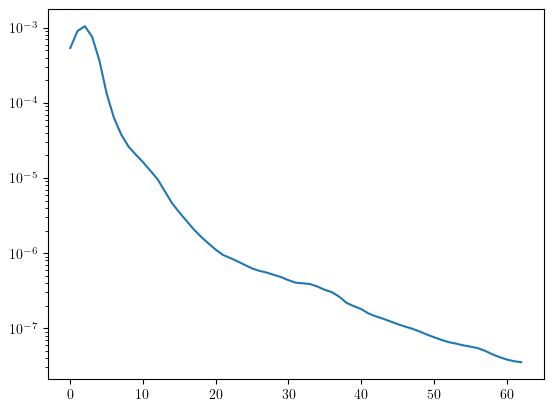

In [12]:
# plt.semilogy(regularization.average_over_shells(np.abs(grad_norm_gt2)**2, volume_shape))
plt.semilogy(regularization.average_over_shells(np.abs(grad_norm_gt)**2, volume_shape))

In [9]:
from recovar import regularization
gt_avged = regularization.average_over_shells(np.abs(gt_vol)**2, volume_shape)
# noise = regularization.average_over_shells(np.abs(gt_vol)**2, volume_shape)
tau = gt_avged/ sim_info['noise_variance']
tau_prior = recovar.utils.make_radial_image(tau, volume_shape)

prior = 1/tau_prior  

reload(homogeneous)
lhs3 = {}
xs = {}
res = {}
res1 = {}
res2 = {}
res3 = {}

for order in [ 0]:
    for dist in [ 0.5, 1, 2]:
        xs[(order, dist)], rr, lhs3[(order, dist)], w, res1[(order, dist)], res2[(order, dist)], res3[(order, dist)] = homogeneous.solve_least_squares_mean_iteration_second_order(
            cryo ,prior, 1e-8,  10, None, image_weights = None, disc_type = None, return_lhs_rhs = False, 
            grid_dist = np.ceil(dist), max_dist=dist*np.ones(cryo.volume_size), order = order  )
        
        # res2[(order, dist)] = jnp.linalg.norm(res[(order, dist)][:,1:], axis=-1)

here
here
here


In [49]:
reload(homogeneous)


def predict_optimal_h_value(summed_grad_terms ,summed_squared_weights, noise_variance, grad_norm, max_dist=1,order =1 ):
    
    # A random divided by 10 term here...
    normalized_c1 = (grad_norm * summed_grad_terms )**2 / 10
    normalized_c2 =  noise_variance* (summed_squared_weights * max_dist**3)
    h = 1/((2*normalized_c1/ (3* normalized_c2)))**(1/5)
    lower_bound = 0.5
    h = np.where(h > lower_bound, h,  np.ones_like(h)* lower_bound)
    return h

def compute_gradient_norm(x):
    x = x.reshape(volume_shape)
    gradients = np.gradient(x)
    gradients = np.stack(gradients, axis=0)
    grad_norm = np.linalg.norm(gradients, axis = (0), ord=2)
    # grad_norm2 = scipy.ndimage.maximum_filter(grad_norm, size =2)
    return grad_norm

def adaptive_discretization(cryo, grad_norm, prior, noise_variance):

    
    
    # grad_norm = compute_gradient_norm(first_estimate.reshape(volume_shape)).reshape(-1)
    # grad_norm = np.abs(gt_vol)
    summed_squared_weights = {}
    xs = {}
    summed_grad_terms = {}
    summed_ = {}
    bias_multiple = {}
    order =0
    dist = 1
    xs[(order, dist)], _, summed_squared_weights[(order, dist)], _, _, summed_grad_terms[(order, dist)], bias_fac = homogeneous.solve_least_squares_mean_iteration_second_order(
    cryo ,prior * 0, 1e-8,  10, None, image_weights = None, disc_type = None, return_lhs_rhs = False, 
    grid_dist = np.ceil(dist), max_dist=dist*np.ones(cryo.volume_size), order = order  )
        
    h_adapt = predict_optimal_h_value(summed_grad_terms[(order, dist)] ,summed_squared_weights[(order, dist)], noise_variance, grad_norm, max_dist=1,order =1 )
    
    max_grid_dist = 3
    dist = 'a'
    xs[(order, dist)], _, summed_squared_weights[(order, dist)], _, _ , summed_grad_terms[(order, dist)], _ = homogeneous.solve_least_squares_mean_iteration_second_order(
    cryo ,prior, 1e-8,  10, None, image_weights = None, disc_type = None, return_lhs_rhs = False, 
    grid_dist = max_grid_dist, max_dist=h_adapt, order = order  )
    
    return xs[(order, dist)], h_adapt


from recovar import homogeneous
lhs, rhs = homogeneous.solve_least_squares_mean_iteration(cryo , np.inf, 1,  1000, None, image_weights = None, disc_type = 'nearest', return_lhs_rhs = True )
x = (rhs[0]/(lhs[0] + 1 /tau_prior))

bias_fac = np.abs(lhs[0]/ (lhs[0] + 1 /tau_prior))
grad_norm = compute_gradient_norm(x.reshape(volume_shape)).reshape(-1)
grad_norm_radial_mod = regularization.average_over_shells(grad_norm**1, volume_shape)/ np.sqrt(regularization.average_over_shells(bias_fac, volume_shape))
grad_norm_est = utils.make_radial_image(grad_norm_radial_mod, volume_shape)

prior = 1/tau_prior  
good_idx = lhs[0] > 0
lhs = lhs[0]
order =0;dist ='aa'
xs[(order, dist)], h_adapt = adaptive_discretization(cryo, grad_norm_est, prior, noise_variance[0])




TOOK OUT IMAGE MASK IN MEAN!!! PUT IT BACK??
here
here


In [50]:
from recovar import homogeneous
lhs, rhs = homogeneous.solve_least_squares_mean_iteration(cryo , np.inf, 1,  1000, None, image_weights = None, disc_type = 'nearest', return_lhs_rhs = True )
x_og = (rhs[0]/(lhs[0] + 1 /tau_prior))
grad_norm = compute_gradient_norm(x.reshape(volume_shape)).reshape(-1)

TOOK OUT IMAGE MASK IN MEAN!!! PUT IT BACK??


In [66]:
reload(homogeneous)
x_new_adapt, h_adapt, prior2 = homogeneous.compute_with_adaptive_discretization(cryo, lhs[0], tau_prior, x_og, noise_variance[0])
xs[(0,'aa')]=x_new_adapt

here
here


In [67]:
# np.linalg.norm(prior2 -  1/tau_prior  )


0.0

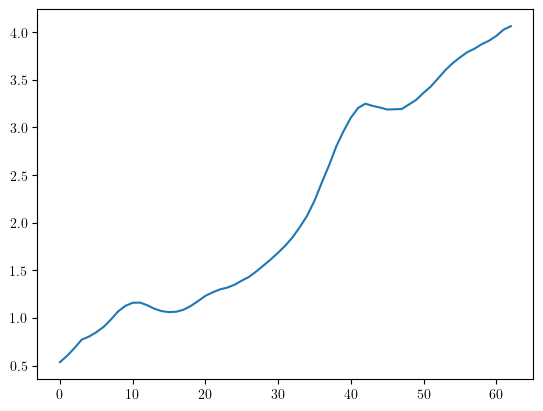

In [61]:
plt.plot(regularization.average_over_shells(h_adapt, volume_shape))#/ regularization.average_over_shells(bias_fac, volume_shape))

In [159]:
bias_fac_avged = regularization.average_over_shells(bias_fac, volume_shape)

In [126]:
first_estimate = x
grad_norm = compute_gradient_norm(first_estimate.reshape(volume_shape)).reshape(-1)
grad_norm_gt = compute_gradient_norm(x_gt.reshape(volume_shape)).reshape(-1)


NameError: name 'grad_norm_gt' is not defined

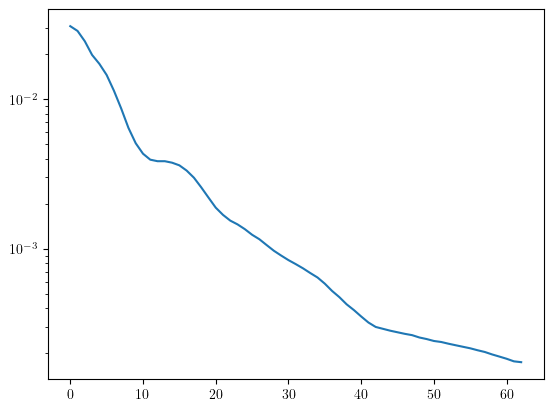

In [12]:
# plt.semilogy(regularization.average_over_shells(np.abs(gt_vol), volume_shape))
# plt.semilogy(regularization.average_over_shells(grad_norm*bias_fac, volume_shape))
plt.semilogy(regularization.average_over_shells(grad_norm**1, volume_shape)/ np.sqrt(regularization.average_over_shells(bias_fac, volume_shape)))
plt.semilogy(regularization.average_over_shells(grad_norm_gt**1, volume_shape))

In [56]:
# print(regularization.average_over_shells(h_adapt, volume_shape))

0.5
0.5
1
1
2
2


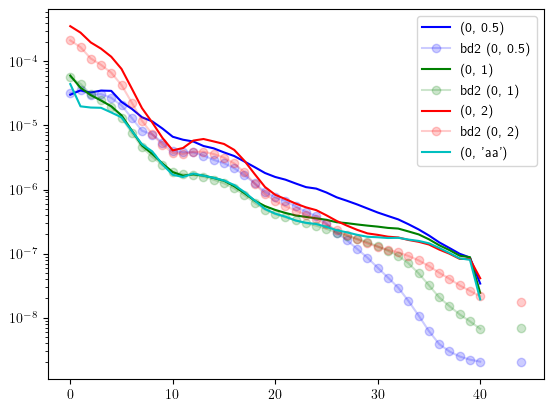

In [64]:
import scipy
def compute_hessian_norm(x):
    x = x.reshape(volume_shape)
    gradients = np.gradient(x)
    hessians = [np.gradient(dx) for dx in gradients ]
    hessians = np.stack(hessians, axis=0)
    
    return np.linalg.norm(hessians, axis = (0,1), ord =2)


noise_var = sim_info['noise_variance']
n_images_per_freqish = cryo.n_images/np.arange(1,65)
image_per_pixels = utils.make_radial_image(n_images_per_freqish, volume_shape).reshape(volume_shape).reshape(-1)

x_gt = gt_vol
grad_norm = 1*compute_gradient_norm(x_gt.reshape(volume_shape)).reshape(-1)
hess_norm = compute_hessian_norm(x_gt.reshape(volume_shape)).reshape(-1)

grad_norm = 1*compute_gradient_norm(xs[(0, 1)].reshape(volume_shape)).reshape(-1)
hess_norm = compute_hessian_norm(xs[(0, 1)].reshape(volume_shape)).reshape(-1)

grad_norm_gt = compute_gradient_norm(x_gt.reshape(volume_shape)).reshape(-1)


def compute_pred_error_one(d,h):
    grad_term = grad_norm if d==1 else hess_norm
    pred_err = ((1/np.math.factorial(d) ) * grad_norm_gt * h **d)**2 + noise_var[0] * lhs3 / ( h**3) 
    # h_avg = regularization.average_over_shells(pred_err,volume_shape)
    return pred_err

def compute_pred_error_two(d,res,lhs3, max_dist=1, res_already_scaled= True ):
    # h_avg = regularization.average_over_shells(h,volume_shape)
    # max_dist =1
    grad_term = grad_norm if d==1 else hess_norm
    # disc_error = ((1/np.math.factorial(d) ) * grad_term **d )**2  * dists**2  * zz
    if res_already_scaled:
        disc_error = (res*grad_norm_gt)**2  #* res * max_dist**2
    else:
        disc_error = (res*grad_norm_gt*max_dist)**2  #* res * max_dist**2
        
    disc_error /= 10
    print(max_dist)
    noise_error =  noise_var[0] * lhs3 #/ ( h**3) 
    
    
    # h_avg = regularization.average_over_shells(pred_err,volume_shape)
    return disc_error + noise_error, disc_error, noise_error


def compute_pred_error_three(d,res2, res3,lhs3, max_dist=1 ):
    # h_avg = regularization.average_over_shells(h,volume_shape)
    # max_dist =1
    grad_term = grad_norm if d==1 else hess_norm
    disc_error = (res3*grad_norm_gt)**2  #* res * max_dist**2
    
    disc_error += (res2*hess_norm)**2 * max_dist**2  #* res * max_dist**2
        
        
    print(max_dist)
    noise_error =  noise_var[0] * lhs3 #/ ( h**3) 
    
    # h_avg = regularization.average_over_shells(pred_err,volume_shape)
    return disc_error + noise_error, disc_error, noise_error


def optimal_h_obj_fun(d,res,lhs3, h=1, max_dist =1 ):
    normalized_c1 = (grad_norm_gt * res )**2 
    
    normalized_c2 =  noise_var[0] * (lhs3 * max_dist**3)

    # h = (2*c1/ c2)**(1/3)    
    
    # h_avg = regularization.average_over_shells(pred_err,volume_shape)
    return normalized_c1 * h **2 + normalized_c2 / (h**3)

# normalized_c1 * 2*  h **1 - 3 *normalized_c2 / (h**4) = 0
# normalized_c1 * 2*  h**(5) **1 - 3 *normalized_c2  = 0
#  h**(5)  = 3 *normalized_c2/ normalized_c1 * 2
#  h**(3)  = normalized_c1 * 2 /3 *normalized_c2



def average_over_subset(x1, x2, mask):
    x1_masked = np.where(mask, x1, np.zeros_like(x1))
    x2_masked = np.where(mask, x2, np.zeros_like(x2))    
    return regularization.average_over_shells(np.abs(x1_masked - x2_masked)**2, volume_shape)/ regularization.average_over_shells((mask)*1.0,tuple(volume_shape))
    # return regularization.average_over_shells(np.abs(x1_masked - x2_masked)**2, volume_shape)/ regularization.average_over_shells(np.abs(x1_masked)**2,tuple(volume_shape))

def average_pred_error_over_subset(pred_err, gt_vol, mask):
    pred_err = np.where(mask, pred_err, np.zeros_like(pred_err))
    gt_vol = np.where(mask, gt_vol, np.zeros_like(gt_vol))    
    return regularization.average_over_shells(np.abs(pred_err), volume_shape)/ regularization.average_over_shells((mask)*1.0,tuple(volume_shape))
    # return regularization.average_over_shells(np.abs(pred_err), volume_shape)/  regularization.average_over_shells(np.abs(gt_vol)**2*1.0,tuple(volume_shape))

def average_over_non_zeros(x,mask):
    x_masked =  np.where(mask, x, np.zeros_like(x))
    return regularization.average_over_shells(x_masked, volume_shape)/ regularization.average_over_shells((mask)*1.0,tuple(volume_shape))
    
    
good_idx = lhs3[(0,0.5)] >1e-4
idx = 0
import matplotlib
colors = list(matplotlib.colors.BASE_COLORS.keys())

for key in xs.keys():
    if key[1] ==0.25:
        continue

    # if key[0] ==1:
    #     continue
    x = xs[key].copy()
    error_per_shell = average_over_subset(gt_vol, x, good_idx)
    # plt.figure()
    
    plt.semilogy(error_per_shell[1:], colors[idx], label=key)
    # err_bound3,disc_error, noise_error = compute_pred_error_two(1,res3[key], lhs3[key], key[1],res_already_scaled = True )
    # avged_err_bound2 =  average_pred_error_over_subset(err_bound3.reshape(-1), gt_vol, good_idx)[1:]
    # plt.semilogy(avged_err_bound2, '->'+colors[idx],  label= 'bd3 '+ str(key), alpha = 0.2 )
    if key[1] =='a' or key[1] =='aa':
        continue
    
    
    err_bound2,disc_error, noise_error = compute_pred_error_two(1,res2[key], lhs3[key], key[1],res_already_scaled = True )
    avged_err_bound2 =  average_pred_error_over_subset(err_bound2.reshape(-1), gt_vol, good_idx)[1:]
    plt.semilogy(avged_err_bound2, '-o'+colors[idx],  label= 'bd2 '+ str(key), alpha = 0.2 )
    
#     err_bound,disc_error, noise_error = compute_pred_error_two(1,res1[key], lhs3[key], key[1], res_already_scaled = False)
#     avged_err_bound2 =  average_pred_error_over_subset(err_bound.reshape(-1), gt_vol, good_idx)[1:]
#     plt.semilogy(avged_err_bound2, '--'+colors[idx],  label= 'bd1 '+ str(key), alpha = 0.2 )

    
    err_bound,disc_error, noise_error = compute_pred_error_three(1,res2[key], res3[key], lhs3[key], key[1])
    avged_err_bound2 =  average_pred_error_over_subset(err_bound.reshape(-1), gt_vol, good_idx)[1:]
    # plt.semilogy(avged_err_bound2, '-x'+colors[idx],  label= 'bd4 '+ str(key), alpha = 0.2 )

    # break
    # plt.semilogy(average_pred_error_over_subset(noise_error.reshape(-1), gt_vol, good_idx)[1:], '-x'+colors[idx], label= 'noise_bd '+ str(key), alpha = 0.2 )
    # plt.semilogy(average_pred_error_over_subset(disc_error.reshape(-1), gt_vol, good_idx)[1:], '->'+colors[idx], label= 'disc_bd '+ str(key), alpha = 0.2 )

    # key_t = (0,1)
    # pred_from_model = optimal_h_obj_fun(1,res3[key_t],lhs3[key_t], h=key[1], max_dist =key_t[1] )
    # avged_pred_from_model =  average_pred_error_over_subset(pred_from_model.reshape(-1), gt_vol, good_idx)[1:]
    # plt.semilogy(avged_pred_from_model, '-x'+colors[idx],  label= 'bd '+ str(key), alpha = 0.2 )
    idx+=1
# plt.semilogy(average_pred_error_over_subset(xx, gt_vol, good_idx)[1:], '-x'+colors[idx],  label= 'AA ', alpha = 1)
plt.legend()

In [178]:
# import matplotlib
# list(matplotlib.colors.BASE_COLORS.keys())


['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']

In [ ]:
grad_norm_gt = 1*compute_gradient_norm(x_gt.reshape(volume_shape)).reshape(-1)
hess_norm = compute_hessian_norm(x_gt.reshape(volume_shape)).reshape(-1)
grad_norm = 1*compute_gradient_norm(xs[(0, 1)].reshape(volume_shape)).reshape(-1)
hess_norm = compute_hessian_norm(xs[(0, 1)].reshape(volume_shape)).reshape(-1)

In [95]:
xx =( res3[key]**2/(res3[key] + prior)**2)

In [96]:
xx_avg = regularization.average_over_shells(xx, volume_shape)

In [99]:
# xx_avg

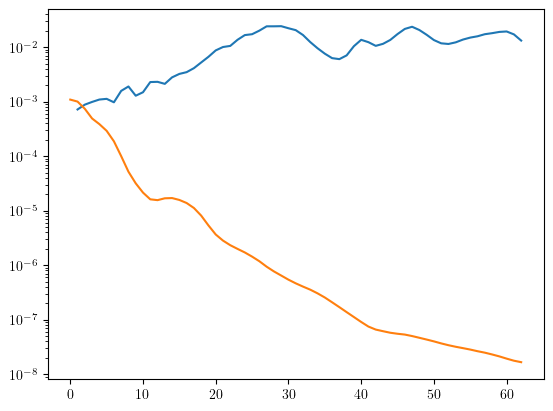

In [98]:
plt.semilogy(regularization.average_over_shells(grad_norm**2  , volume_shape)/ xx_avg)
plt.semilogy(regularization.average_over_shells(grad_norm_gt**2, volume_shape))

TOOK OUT IMAGE MASK IN MEAN!!! PUT IT BACK??


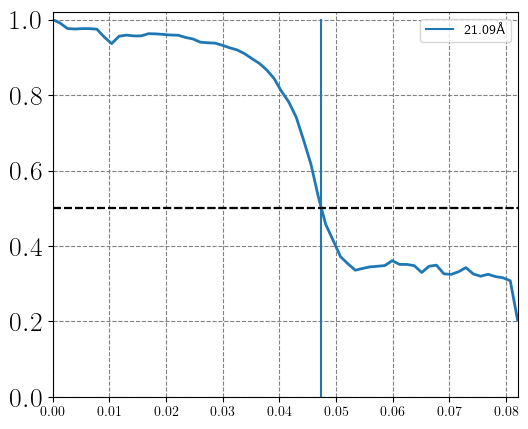

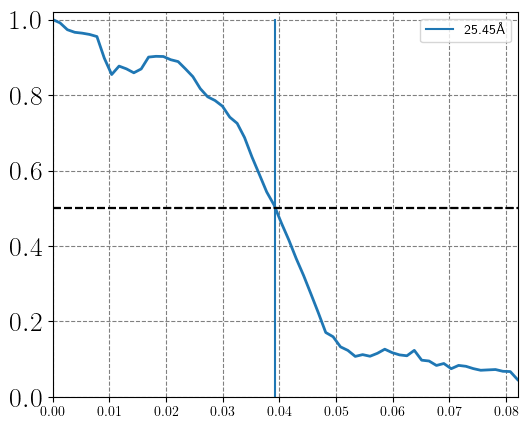

In [49]:
from recovar import homogeneous
lhs, rhs = homogeneous.solve_least_squares_mean_iteration(cryo , np.inf, 1,  1000, None, image_weights = None, disc_type = 'nearest', return_lhs_rhs = True )
x = (rhs[0]/(lhs[0] + 1 /tau_prior))
good_idx = lhs[0] > 0
lhs = lhs[0]
ax, score_masked = plot_utils.plot_fsc_new(gt_vol, xs[key], cryo.volume_shape, cryo.voxel_size,  curve = None, ax = None, threshold = 1/2, filename = None)#, volume_mask = results['volume_mask'], name = "masked")
ax, score_masked = plot_utils.plot_fsc_new(gt_vol, x, cryo.volume_shape, cryo.voxel_size,  curve = None, ax = None, threshold = 1/2, filename = None)#, volume_mask = results['volume_mask'], name = "masked")


TOOK OUT IMAGE MASK IN MEAN!!! PUT IT BACK??


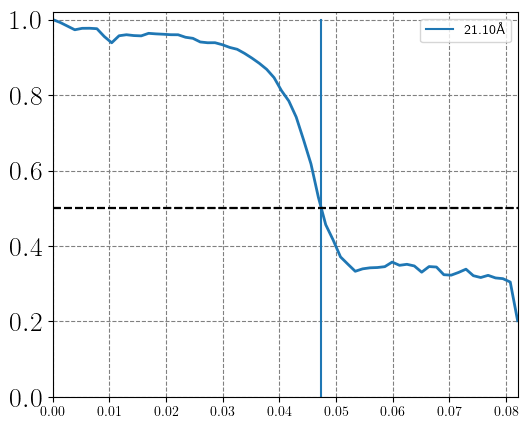

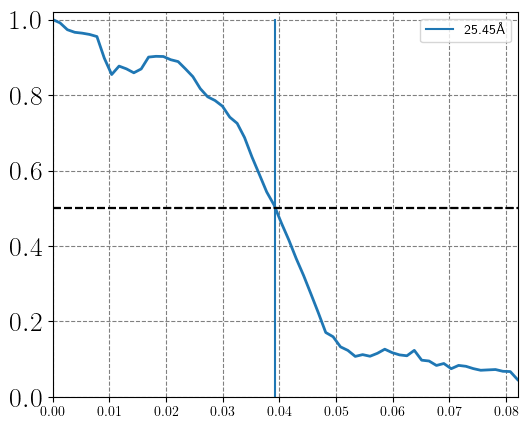

In [66]:
from recovar import homogeneous
lhs, rhs = homogeneous.solve_least_squares_mean_iteration(cryo , np.inf, 1,  1000, None, image_weights = None, disc_type = 'nearest', return_lhs_rhs = True )
x = (rhs[0]/(lhs[0] + 1 /tau_prior))
good_idx = lhs[0] > 0
lhs = lhs[0]
ax, score_masked = plot_utils.plot_fsc_new(gt_vol, xs[key], cryo.volume_shape, cryo.voxel_size,  curve = None, ax = None, threshold = 1/2, filename = None)#, volume_mask = results['volume_mask'], name = "masked")
ax, score_masked = plot_utils.plot_fsc_new(gt_vol, x, cryo.volume_shape, cryo.voxel_size,  curve = None, ax = None, threshold = 1/2, filename = None)#, volume_mask = results['volume_mask'], name = "masked")


In [51]:
none_xs = np.where(np.isnan(xs[key]), np.zeros_like(np.isnan(xs[key])), xs[key])
output.save_volume( none_xs, 'new', volume_shape)
output.save_volume( x, 'og', volume_shape)


In [62]:
key_t = (0,1)
# pred_from_model = optimal_h_obj_fun(1,res[key_t],lhs3[key_t], h=key[1], max_dist =key_t[1] )

h_adapt = predict_optimal_h_value(1,res2[key_t],lhs3[key_t], max_dist=key_t[1])
print(regularization.average_over_shells(h_adapt, volume_shape) )
reload(homogeneous)
order =0
key = (order, 'a')
xs[key], rr, lhs3[key], w, res1[key], res2[key], res3[key] = homogeneous.solve_least_squares_mean_iteration_second_order(
    cryo ,prior, 1e-8,  10, None, image_weights = None, disc_type = None, return_lhs_rhs = False, grid_dist = 4, max_dist=h_adapt, order = 0  )


order =1
key = (order, 'a')
xs[key], rr, lhs3[key], w, res1[key], res2[key], res3[key] = homogeneous.solve_least_squares_mean_iteration_second_order(
    cryo ,prior, 1e-8,  10, None, image_weights = None, disc_type = None, return_lhs_rhs = False, grid_dist = 3, max_dist=h_adapt, order = 0  )


1
[0.51894013 0.58246785 0.66258299 0.74886167 0.77759355 0.82863072
 0.88631166 0.98197387 1.10178141 1.1775713  1.22660647 1.23039512
 1.19229698 1.14223334 1.10313708 1.10103872 1.10325025 1.13483962
 1.19670663 1.2758245  1.35166827 1.39344145 1.42112041 1.44031309
 1.48692623 1.54546351 1.62506715 1.71549229 1.79439774 1.86665341
 1.94601437 2.03804336 2.14850181 2.27226236 2.42581428 2.6075979
 2.82227975 3.05087869 3.2542201  3.44028575 3.58379635 3.66851364
 3.69735019 3.69312086 3.68912359 3.66307601 3.67034814 3.70554743
 3.79113719 3.88632668 3.99971424 4.1262798  4.2480793  4.36754919
 4.44691003 4.51907899 4.57770571 4.61897713 4.67784665 4.75226065
 4.84464875 4.95422677 5.06285533]
here


In [94]:
order =0
key = (order, 'a')
xs[key], rr, lhs3[key], w, res1[key], res2[key], res3[key] = homogeneous.solve_least_squares_mean_iteration_second_order(
    cryo ,prior, 1e-8,  10, None, image_weights = None, disc_type = None, return_lhs_rhs = False, grid_dist = 3, max_dist=h_adapt, order = order  )


here


In [45]:
print(regularization.average_over_shells(h_adapt, volume_shape) )


[0.51894013 0.58246785 0.66258299 0.74886167 0.77759355 0.82863072
 0.88631166 0.98197387 1.10178141 1.1775713  1.22660647 1.23039512
 1.19229698 1.14223334 1.10313708 1.10103872 1.10325025 1.13483962
 1.19670663 1.2758245  1.35166827 1.39344145 1.42112041 1.44031309
 1.48692623 1.54546351 1.62506715 1.71549229 1.79439774 1.86665341
 1.94601437 2.03804336 2.14850181 2.27226236 2.42581428 2.6075979
 2.82227975 3.05087869 3.2542201  3.44028575 3.58379635 3.66851364
 3.69735019 3.69312086 3.68912359 3.66307601 3.67034814 3.70554743
 3.79113719 3.88632668 3.99971424 4.1262798  4.2480793  4.36754919
 4.44691003 4.51907899 4.57770571 4.61897713 4.67784665 4.75226065
 4.84464875 4.95422677 5.06285533]


In [68]:
xs.keys()

dict_keys([(0, 0.25), (0, 0.5), (0, 1), (0, 2), (0, 'a'), (1, 'a')])

In [53]:
xx = optimal_h_obj_fun(1,res[key_t],lhs3[key_t], h=h_adapt, max_dist=key_t[1])

In [27]:
err_bound2

Array([0., 0., 0., ..., 0., 0., 0.], dtype=float64)

In [22]:
key_t = (0,1)
pred_from_model = optimal_h_obj_fun(1,res[key_t],lhs3[key_t], h=1, max_dist =1 )

In [23]:
pred_from_model

Array([nan, nan, nan, ..., nan, nan, nan], dtype=float64)

In [ ]:
good_idx = lhs3[(0,0.25)] >1e-4

average_over_non_zeros(res[(0,0.25)], good_idx)

In [39]:
np.min(res[(0,2)])

Array(0., dtype=float64)

In [37]:
good_idx = lhs3[(0,2)] >1e-4

average_over_non_zeros(res[(0,2)], good_idx)

Array([1.00000000e+02, 4.17706597e+27, 1.36092324e+27, 4.04008165e+26,
       9.77358222e+25, 2.82889303e+25, 1.06921655e+25, 6.18363873e+24,
       4.19127981e+24, 3.59705788e+24, 3.19331978e+24, 2.42089173e+24,
       1.55764084e+24, 9.51752077e+23, 6.39708679e+23, 4.55504871e+23,
       3.61765215e+23, 3.00869904e+23, 2.28750402e+23, 1.56962567e+23,
       1.16611210e+23, 1.02373037e+23, 9.41725504e+22, 8.64422102e+22,
       7.58605094e+22, 6.62704206e+22, 5.89102995e+22, 5.32493877e+22,
       4.89265326e+22, 4.46498837e+22, 4.26163983e+22, 4.10071104e+22,
       3.86442964e+22, 3.73148406e+22, 3.73779342e+22, 3.59204682e+22,
       2.89923716e+22, 2.40593343e+22, 2.09516722e+22, 1.86916292e+22,
       1.67980768e+22, 1.58894744e+22, 1.42459556e+22, 1.26930458e+22,
       1.18065904e+22, 1.14689649e+22, 1.04941008e+22, 9.51001796e+21,
       8.33936193e+21, 7.40548477e+21, 6.58296166e+21, 5.88229066e+21,
       5.41392660e+21, 5.15644775e+21, 5.04779014e+21, 4.88084024e+21,
      

In [38]:
regularization.average_over_shells(res[(0,2)], volume_shape)

Array([1.00000000e+02, 4.17706597e+27, 1.36092324e+27, 4.04008165e+26,
       9.77358222e+25, 2.81272793e+25, 1.03595204e+25, 6.01928953e+24,
       4.04827026e+24, 3.31987654e+24, 2.88676108e+24, 2.19839550e+24,
       1.35155826e+24, 7.97933560e+23, 5.29590692e+23, 3.69685113e+23,
       2.94570957e+23, 2.29087939e+23, 1.74223328e+23, 1.16551369e+23,
       8.26517274e+22, 7.23096914e+22, 6.53320100e+22, 5.78725491e+22,
       5.01764603e+22, 4.26625112e+22, 3.75941627e+22, 3.27390345e+22,
       2.96054144e+22, 2.63751730e+22, 2.43413813e+22, 2.33496769e+22,
       2.15140149e+22, 2.03201233e+22, 2.01000766e+22, 1.85630852e+22,
       1.47657757e+22, 1.19581371e+22, 1.04150435e+22, 8.96998825e+21,
       8.12590569e+21, 7.37360506e+21, 6.53204503e+21, 5.66215229e+21,
       5.28109446e+21, 5.04181814e+21, 4.54189889e+21, 4.06317644e+21,
       3.43834423e+21, 3.00986140e+21, 2.66039418e+21, 2.36787279e+21,
       2.11878167e+21, 2.01551455e+21, 1.91720151e+21, 1.83280849e+21,
      

In [21]:
CTF_params

NameError: name 'CTF_params' is not defined

In [17]:
np.min(lhs3[(0,0.5)][good_idx])# >1e-4

Array(0.01, dtype=float64)

In [18]:
res[(order, dist)][good_idx]

Array([1., 1., 1., ..., 1., 1., 1.], dtype=float64)

In [ ]:
    
good_idx = lhs3[(0,0.5)] >0
idx = 0
colors = ['r', 'b', 'g', 'k','y']
for key in xs.keys():
    if key[0] ==0:
        continue
    x = xs[key]
    error_per_shell = average_over_subset(gt_vol, x, good_idx)
    plt.semilogy(error_per_shell[1:], colors[idx], label=key)
    if key[1] =='a':
        continue

    err_bound2,disc_error, noise_error = compute_pred_error_two(1,res[key], lhs3[key], key[1])

    # plt.semilogy(error_per_shell[1:], label=key)
    # plt.semilogy(average_pred_error_over_subset(err_bound2.reshape(-1), gt_vol, good_idx)[1:], '-o'+colors[idx],  label= 'bd '+ str(key), alpha = 0.2 )
    # plt.semilogy(average_pred_error_over_subset(noise_error.reshape(-1), gt_vol, good_idx)[1:], '-x'+colors[idx], label= 'noise_bd '+ str(key), alpha = 0.2 )
    plt.semilogy(average_pred_error_over_subset(disc_error.reshape(-1), gt_vol, good_idx)[1:], '->'+colors[idx], label= 'disc_bd '+ str(key), alpha = 0.2 )
    idx+=1
    
    # if idx > 2:
    #     break
plt.legend()


In [282]:
def predict_optimal_h_value(d,res,lhs3, max_dist=1 ):
    
    c1 = grad_norm_gt**2  * res * max_dist**2
    
    c2 = noise_var[0] * lhs3 / max_dist**3

    h = (2*c1/ (3*c2))**(-1/3)
    
    max_h = 2.2
    h = np.where(h < 0.5, np.ones_like(h) * 0.5, h)
    h = np.where(h > max_h, np.ones_like(h) * max_h, h)
    h = np.where(np.isnan(h), max_h, h)

    return h


In [283]:
key = (0,1)
h_adapt = np.array(predict_optimal_h_value(1,res[key], lhs3[key], key[1]))
voxels = ftu.get_k_coordinate_of_each_pixel(volume_shape,1,scaled = False)
freqs_norm = np.linalg.norm(voxels, axis=-1)
h_adapt[freqs_norm< 10] = 0.5


In [284]:
# freqs_norm.shape

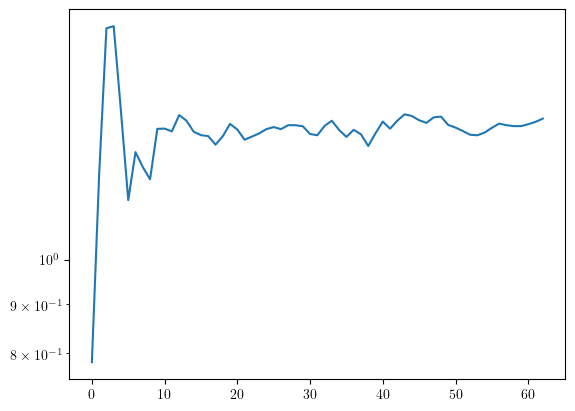

In [29]:
plt.semilogy(regularization.average_over_shells((grad_norm/hess_norm), volume_shape))
# plt.semilogy(regularization.average_over_shells(hess_norm, volume_shape))

In [260]:
np.max(h_adapt)

nan

In [261]:
regularization.average_over_shells(hh, volume_shape)

Array([0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
       0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
       0.66655899, 0.77343125, 0.81653177, 0.91436535, 1.03476898,
       1.14039739, 1.24713286, 1.37894217, 1.50606395, 1.6519271 ,
       1.79349771, 1.84030259, 1.87106311, 1.91038531, 1.94808953,
       2.00865897, 2.07372104, 2.13407515, 2.20435734, 2.26436669,
       2.34733576, 2.40806087, 2.401263  , 2.42499393, 2.49180554,
       2.56058353, 2.62960827, 2.74019163, 2.90994306, 3.00781162,
       3.09662729, 3.22958197, 3.31989934, 3.40816421, 3.49026458,
       3.59686072, 3.7076565 , 3.7724724 , 3.85499501, 3.99766041,
       4.10870767, 4.20962209, 4.32090291, 4.43021987, 4.51557721,
       4.5858315 , 4.66195352, 4.77020637, 4.91782386, 5.0558285 ,
       5.17783124, 5.2486829 , 5.31385182], dtype=float64)

In [99]:

# err_bound2,disc_error, noise_error = compute_pred_error_two(1,zz)

# error_per_shell = average_over_subset(gt_vol, x3, good_idx)
# error_per_shell4 = average_over_subset(gt_vol, x4, good_idx)
# error_per_shellx3_f = average_over_subset(gt_vol, x3_h, good_idx)

# error_per_shell5 = average_over_subset(gt_vol, x1_1, good_idx)
# error_per_shell2_1 = average_over_subset(gt_vol, x2_1, good_idx)

# error_per_shell3 = average_pred_error_over_subset(err_bound2.reshape(-1), gt_vol, good_idx)

# plt.semilogy(average_pred_error_over_subset(disc_error.reshape(-1), gt_vol, good_idx)[1:],label='disc_error')
# plt.semilogy(average_pred_error_over_subset(err_bound2.reshape(-1), gt_vol, good_idx)[1:],label='err_bound')

# # plt.semilogy(average_pred_error_over_subset(noise_error.reshape(-1), gt_vol, good_idx)[1:],label='noise_error')
# plt.semilogy(error_per_shell4[1:], label='actual_2')
# plt.semilogy(error_per_shell5[1:], label='x1_1')
# plt.semilogy(error_per_shell[1:], label='actual')
# plt.semilogy(error_per_shell2_1[1:], label='x2_1')
# plt.semilogy(error_per_shellx3_f[1:], label='x3_h')
# # plt.semilogy(error_per_shell3[1:], label= 'bound2')
# plt.legend()

In [100]:
plt.semilogy(regularization.average_over_shells(lhs3, volume_shape))


AttributeError: 'dict' object has no attribute 'reshape'

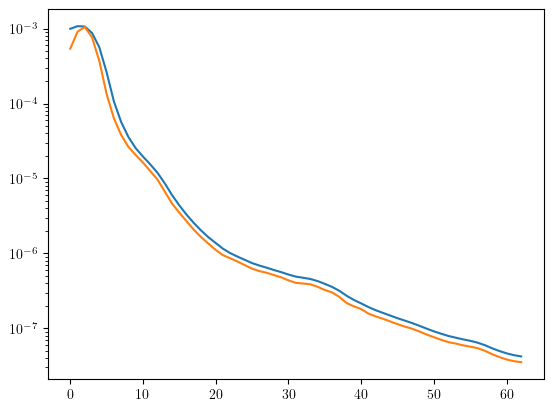

In [60]:
plt.semilogy(regularization.average_over_shells(np.abs(grad_norm)**2, volume_shape))
plt.semilogy(regularization.average_over_shells(np.abs(grad_norm_gt)**2, volume_shape))
# plt.semilogy(regularization.average_over_shells(np.abs(grad_norm_gt2)**2, volume_shape))

In [22]:
xx = regularization.average_over_shells(np.abs(grad_norm_gt)**2, volume_shape)

In [96]:
grad_norm

array([0.00025468, 0.00025468, 0.00019787, ..., 0.00012165, 0.00010794,
       0.00014661])

In [93]:
reload(homogeneous)
dists = 1
x3, rr, lhs3, res,w = homogeneous.solve_least_squares_mean_iteration_second_order(
    cryo ,prior, 1e-8,  10, None, image_weights = None, disc_type = None, return_lhs_rhs = False, grid_dist = dists, max_dist=dists, order = 0  )
good_idx = lhs3 > 0


err_bound2,disc_error, noise_error = compute_pred_error_two(1,zz)


here


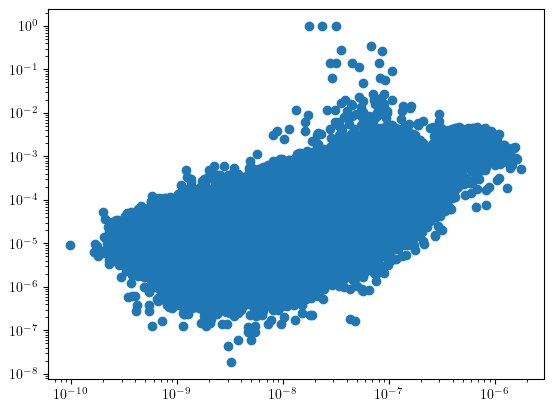

In [94]:
plt.scatter(disc_error, act_error)
plt.yscale('log')
plt.xscale('log')

In [59]:
xx = regularization.average_over_shells(disc_error, volume_shape)

In [60]:
xx2 = regularization.average_over_shells(grad_norm, volume_shape)

In [97]:
print(regularization.average_over_shells(grad_norm**2, volume_shape))

[7.39652216e-04 8.01684765e-04 7.93732306e-04 6.50328330e-04
 4.18401540e-04 1.94946977e-04 7.99935256e-05 4.26897912e-05
 2.70738082e-05 1.92998712e-05 1.50405630e-05 1.19084715e-05
 9.23579354e-06 6.72257392e-06 4.73243015e-06 3.48567649e-06
 2.64423906e-06 2.07080522e-06 1.66458765e-06 1.37165146e-06
 1.16491388e-06 9.93263119e-07 8.80927808e-07 8.03073743e-07
 7.39816971e-07 6.80550555e-07 6.42912127e-07 6.13392157e-07
 5.81084609e-07 5.55420305e-07 5.25949090e-07 5.04372078e-07
 4.98338109e-07 4.89732871e-07 4.69641501e-07 4.40368411e-07
 4.09383760e-07 3.71707131e-07 3.27619827e-07 2.96090058e-07
 2.73593736e-07 2.51511282e-07 2.34831822e-07 2.22554840e-07
 2.11432940e-07 2.01045916e-07 1.92483207e-07 1.83898719e-07
 1.74617294e-07 1.65340828e-07 1.57388700e-07 1.51556461e-07
 1.46623496e-07 1.44407475e-07 1.42292798e-07 1.41148619e-07
 1.38210090e-07 1.32685739e-07 1.25211691e-07 1.19785737e-07
 1.16422718e-07 1.14995776e-07 1.15525588e-07]


In [62]:
xx

Array([1.87629736e-07, 3.22393529e-07, 6.24667125e-07, 7.29135542e-07,
       6.11618806e-07, 3.51268753e-07, 1.74917254e-07, 1.06459017e-07,
       7.48621837e-08, 5.86348717e-08, 4.97085268e-08, 4.14810237e-08,
       3.39942990e-08, 2.62839221e-08, 1.97700305e-08, 1.61488842e-08,
       1.40599393e-08, 1.37152406e-08, 1.42366388e-08, 1.43410745e-08,
       1.34007036e-08, 1.14229850e-08, 9.59412466e-09, 8.42293618e-09,
       7.89418528e-09, 7.66598295e-09, 7.74557489e-09, 7.74729058e-09,
       7.60765992e-09, 7.47278868e-09, 7.27952087e-09, 7.13898803e-09,
       7.34062256e-09, 7.54666342e-09, 7.42875680e-09, 7.22637552e-09,
       6.93830611e-09, 6.48891495e-09, 5.91259394e-09, 5.48264843e-09,
       5.18123296e-09, 4.92502839e-09, 4.84323955e-09, 4.63369576e-09,
       4.41005911e-09, 4.24669676e-09, 4.28469867e-09, 4.19563626e-09,
       4.00593928e-09, 3.90639368e-09, 3.88191286e-09, 3.78921792e-09,
       3.68568903e-09, 3.74939858e-09, 3.78494541e-09, 3.79755694e-09,
      

In [54]:
act_error = np.abs(x3 - gt_vol)

In [51]:
disc_error

Array([0., 0., 0., ..., 0., 0., 0.], dtype=float64)

In [44]:
error_per_shell2_1

Array([3.15928780e-16, 2.26606037e-04, 2.26717585e-04, 3.05995370e-04,
       3.28353370e-04, 9.40712723e-04, 6.63688509e-04, 8.48596712e-04,
       6.33913461e-04, 5.21908685e-04, 4.71816442e-04, 4.41868198e-04,
       4.45161695e-04, 4.64235352e-04, 5.12176271e-04, 5.07442285e-04,
       4.59309667e-04, 4.83629874e-04, 5.35815958e-04, 5.49499856e-04,
       7.37427327e-04, 9.14301428e-04, 8.09415586e-04, 8.78728238e-04,
       1.32488951e-03, 1.46657213e-03, 1.19564058e-03, 1.57728819e-03,
       1.75531995e-03, 2.43195501e-03, 1.89837555e-03, 1.97829593e-03,
       2.33131868e-03, 3.59320575e-03, 3.15823914e-03, 3.31753295e-03,
       5.18633698e-03, 5.84068127e-03, 5.72032438e-03, 6.84633686e-03,
       5.84125095e-03, 7.64324349e-03, 8.42133368e-03, 9.44172167e-03,
       9.70039804e-03, 9.98666980e-03, 1.24862427e-02, 1.29199163e-02,
       1.13966968e-02, 1.43005633e-02, 1.39418571e-02, 1.58684535e-02,
       1.72791066e-02, 1.83321901e-02, 1.99997264e-02, 1.93375294e-02,
      

In [30]:
error_per_shell5[1:]

Array([0.00369945, 0.00341591, 0.0035468 , 0.00572051, 0.00908197,
       0.01077136, 0.01091123, 0.00941988, 0.00768149, 0.00679171,
       0.00659243, 0.00615079, 0.00673145, 0.00703888, 0.00712458,
       0.00673062, 0.00638415, 0.00649973, 0.00668723, 0.00740371,
       0.00805556, 0.007661  , 0.00725861, 0.00694891, 0.00695353,
       0.00715537, 0.00739854, 0.00779408, 0.00750754, 0.0069743 ,
       0.00684016, 0.00674631, 0.0065318 , 0.00633617, 0.0064646 ,
       0.00657119, 0.00671465, 0.00681505, 0.00649306, 0.00626006,
       0.00616912, 0.00591167, 0.0058671 , 0.00580641, 0.00585958,
       0.00584146, 0.00586521, 0.00605168, 0.00637505, 0.0065913 ,
       0.00679715, 0.00689892, 0.00692639, 0.00666672, 0.0065417 ,
       0.00646671, 0.00652753, 0.00634823, 0.00640931, 0.00644272,
       0.00641759, 0.00642592], dtype=float64)

In [ ]:
error_per_shell5[1:]/error_per_shell2_1[1:]

In [19]:
zz

array([0., 0., 0., ..., 0., 0., 0.])

In [30]:
error_per_shell[1:]/error_per_shell5[1:]

Array([1.3743906 , 1.82079992, 2.01846386, 1.86057389, 1.49486037,
       1.44027074, 1.25092059, 1.1824181 , 1.12926597, 1.12475337,
       1.13336469, 1.15325692, 1.09506872, 1.10445156, 1.14806945,
       1.2416191 , 1.33191534, 1.2935451 , 1.3104335 , 1.35602722,
       1.31977489, 1.34542068, 1.3012665 , 1.28686087, 1.34895752,
       1.38008405, 1.43065026, 1.39056305, 1.39824499, 1.38658391,
       1.39661428, 1.43075714, 1.45148698, 1.46461232, 1.49286969,
       1.52358133, 1.53781723, 1.51959563, 1.55984619, 1.57916749,
       1.56476652, 1.64206776, 1.70143045, 1.68409572, 1.68127738,
       1.70560279, 1.74346849, 1.71236854, 1.71050695, 1.74366259,
       1.73474738, 1.73757787, 1.77307871, 1.77915796, 1.81544529,
       1.86264174, 1.86669368, 1.89420738, 1.92100708, 1.964085  ,
       1.99526031, 2.01211534], dtype=float64)

In [17]:
reload(homogeneous)
batch_size = 100
weights, good_weights, RR = homogeneous.compute_discretization_weights(cryo, prior, batch_size, order=0, grid_dist = 1, max_dist = 1 )


here


In [47]:
regularization.average_over_shells(lhs3.astype(float),volume_shape)

Array([0.01288559, 0.01054183, 0.00972383, 0.00795161, 0.00579916,
       0.00406576, 0.00289596, 0.0021965 , 0.00171263, 0.00136652,
       0.00114555, 0.00101777, 0.00095096, 0.00093918, 0.00098959,
       0.00111026, 0.0013409 , 0.0017438 , 0.002357  , 0.0030197 ,
       0.0034107 , 0.00329828, 0.00300167, 0.002785  , 0.00274755,
       0.00287691, 0.00309876, 0.00333227, 0.00349783, 0.00359732,
       0.00367505, 0.00376913, 0.00388333, 0.00400205, 0.00413679,
       0.00428857, 0.00443439, 0.00455846, 0.00467601, 0.00477791,
       0.00489948, 0.0050481 , 0.00520653, 0.00529671, 0.00535505,
       0.00548687, 0.00567795, 0.00582019, 0.00592069, 0.00607332,
       0.00622669, 0.00631441, 0.00638432, 0.00653221, 0.00670844,
       0.00684348, 0.00694195, 0.00701107, 0.00714823, 0.00733942,
       0.00750516, 0.00762269, 0.00773842], dtype=float64)

In [19]:
def wrrw(w,RR):
    w = w.at[0].set(0)
    return w.T @ RR @ w

b_wrrw = jax.vmap(wrrw, in_axes = (0,0))

v = w
zz = b_wrrw(weights, RR)
xxx = regularization.average_over_shells(np.abs(zz), volume_shape)
print(xxx)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [ ]:
error_per_shell = average_over_subset(gt_vol, x, good_idx)
error_per_shell2 = average_over_subset()
    

In [35]:
# grad_norm = compute_gradient_norm(x)
# bound = noise_var[0] * 4 / image_per_pixels / ( 1 * grad_norm**2)
# good_idx = hess_norm > 0
# h2 = bound **(1/5)

In [10]:
from recovar import core
# core.vec_indices_to_frequencies(np.argmax(h[good_idx]), volume_shape)


In [11]:
h_avg = regularization.average_over_shells(h,volume_shape)
h_avg2 = regularization.average_over_shells(h2,volume_shape)

NameError: name 'h2' is not defined

NameError: name 'h_avg2' is not defined

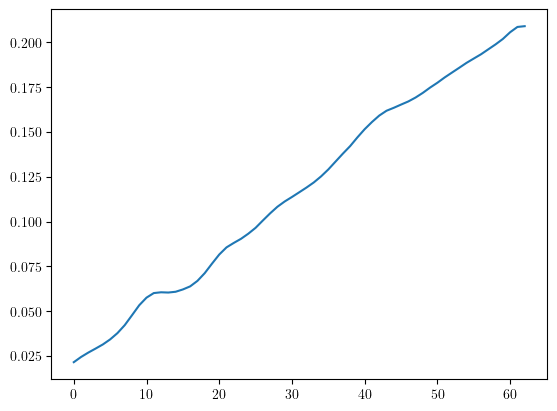

In [12]:
plt.plot(h_avg)
plt.plot(h_avg2)

In [14]:
# Predicted error for h = 1

grad_norm = compute_gradient_norm(x_gt.reshape(volume_shape))
hess_norm = compute_hessian_norm(x_gt.reshape(volume_shape))

def predicted_normalized_error(d,h,x_gt):
    # grad_norm = compute_gradient_norm(x_gt.reshape(volume_shape))
    # hess_norm = compute_hessian_norm(x_gt.reshape(volume_shape))
    grad_term = grad_norm if d==1 else hess_norm
    pred_err = ((1/np.math.factorial(d) ) * grad_term * h **d)**2 + noise_var[0] * 4 / (image_per_pixels * h**3) * 0
    h_avg = regularization.average_over_shells(pred_err,volume_shape)
    
    return h_avg

    


def optimal_h(d):

    grad_term = grad_norm if d==1 else hess_norm
    top = noise_var[0] / image_per_pixels * 3 * 4
    bot = ((1/np.math.factorial(d) ) * grad_term  **d)**2  * 2 * d
    h = (top/bot)**(2*d  + 3)
    return h_avg


h_avg = compute_pred_error(1, h)
h_avg2 = compute_pred_error(2, h2)

h1 = np.ones_like(h)
h_avg_fixed = predicted_normalized_error(1, h1, gt_vol)
h_avg_fixed2 = predicted_normalized_error(2, h1,gt_vol)

# hopt1 = optimal_h(1)
# hopt1_avg = compute_pred_error(1, hopt1)
# hopt2 = optimal_h(2)
# hopt2_avg = compute_pred_error(2, hopt2)



NameError: name 'grad_norm' is not defined

In [ ]:
plt.semilogy(h_avg_fixed/norm_vol, label = 'fixed h, d1')
plt.semilogy(h_avg_fixed2/norm_vol, label = 'fixed h, d2')

plt.semilogy(h_avg/norm_vol, label = 'move h, d1')
plt.semilogy(h_avg2/norm_vol, label = 'move h, d2')
plt.legend()

In [42]:
from recovar import homogeneous
lhs, rhs = homogeneous.solve_least_squares_mean_iteration(cryo , np.inf, 1,  1000, None, image_weights = None, disc_type = 'nearest', return_lhs_rhs = True )
x = (rhs[0]/(lhs[0] + 1 /tau_prior))
good_idx = lhs[0] > 0
lhs = lhs[0]

TOOK OUT IMAGE MASK IN MEAN!!! PUT IT BACK??


In [13]:
x

Array([0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j], dtype=complex128)

In [36]:
from recovar import homogeneous
reload(homogeneous)
x2, _, lhs2 = homogeneous.solve_least_squares_mean_iteration_second_order(cryo , 1/tau_prior, 1,  1000, None, image_weights = None, disc_type = None, return_lhs_rhs = False )

In [37]:
reload(homogeneous)
x3, _, lhs3 = homogeneous.solve_least_squares_mean_iteration_second_order(
    cryo ,1/tau_prior, 1,  10, None, image_weights = None, disc_type = None, return_lhs_rhs = False, grid_dist = 1, max_dist=2.1 )

In [38]:
reload(homogeneous)
x4, _, lhs3 = homogeneous.solve_least_squares_mean_iteration_second_order(
    cryo ,1/tau_prior, 1,  10, None, image_weights = None, disc_type = None, return_lhs_rhs = False, grid_dist = 1, max_dist=2.1, order=0 )

In [39]:
def average_over_subset(x1, x2, mask):
    x1_masked = np.where(mask, x1, np.zeros_like(x1))
    x2_masked = np.where(mask, x2, np.zeros_like(x2))    
    return regularization.average_over_shells(np.abs(x1_masked - x2_masked)**2, volume_shape)/ regularization.average_over_shells(np.abs(x1_masked)**2,volume_shape)
error_per_shell = average_over_subset(gt_vol, x, good_idx)
error_per_shell2 = average_over_subset(gt_vol, x2, good_idx)#regularization.average_over_shells(np.abs((gt_vol - x2)[good_idx])**2, volume_shape)/ regularization.average_over_shells(np.abs((gt_vol)[good_idx])**2,volume_shape)
error_per_shell3 = average_over_subset(gt_vol, x3, good_idx)
error_per_shell4 = average_over_subset(gt_vol, x4, good_idx)#regularization.average_over_shells(np.abs((gt_vol - x2)[good_idx])**2, volume_shape)/ regularization.average_over_shells(np.abs((gt_vol)[good_idx])**2,volume_shape)

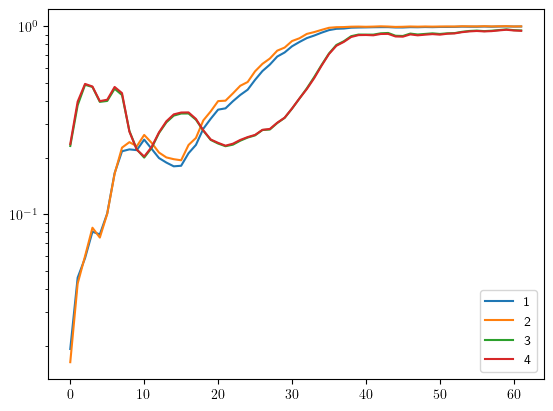

In [40]:
# plt.semilogy(h_avg_fixed/norm_vol, label = 'fixed h, d1')
# plt.semilogy(h_avg_fixed2/norm_vol, label = 'fixed h, d2')

plt.plot(error_per_shell[1:], label = '1')
plt.plot(error_per_shell2[1:], label='2')
plt.plot(error_per_shell3[1:], label='3')
plt.plot(error_per_shell4[1:], label='4')

plt.legend()
plt.yscale('log')

In [41]:
output.save_volume( x, 'og', volume_shape)
output.save_volume( x3, 'new', volume_shape)


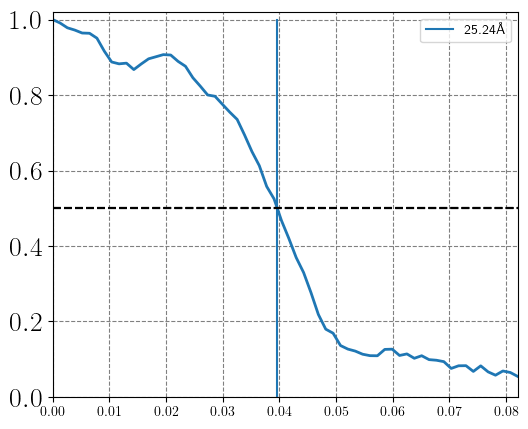

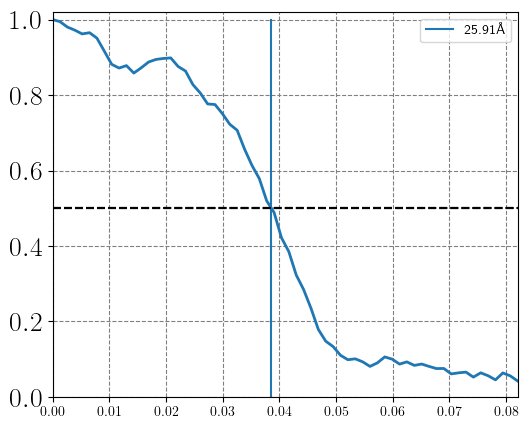

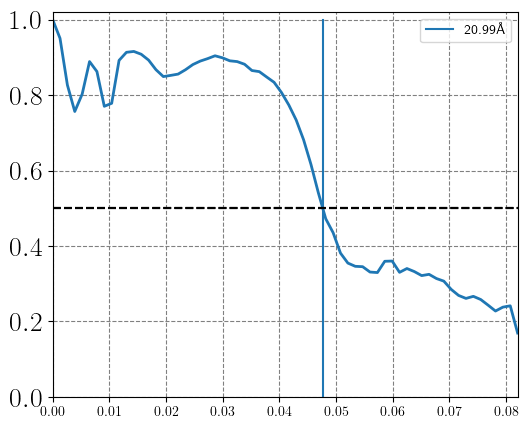

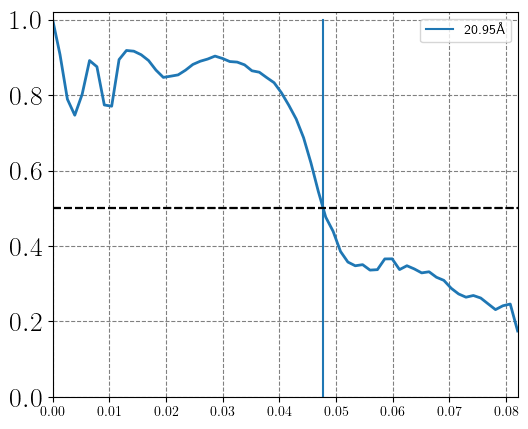

In [42]:
from recovar import plot_utils
ax, score_masked = plot_utils.plot_fsc_new(gt_vol, x, cryo.volume_shape, cryo.voxel_size,  curve = None, ax = None, threshold = 1/2, filename = None)#, volume_mask = results['volume_mask'], name = "masked")
ax, score_masked = plot_utils.plot_fsc_new(gt_vol, x2, cryo.volume_shape, cryo.voxel_size,  curve = None, ax = None, threshold = 1/2, filename = None)#, volume_mask = results['volume_mask'], name = "masked")
ax, score_masked = plot_utils.plot_fsc_new(gt_vol, x3, cryo.volume_shape, cryo.voxel_size,  curve = None, ax = None, threshold = 1/2, filename = None)#, volume_mask = results['volume_mask'], name = "masked")
ax, score_masked = plot_utils.plot_fsc_new(gt_vol, x4, cryo.volume_shape, cryo.voxel_size,  curve = None, ax = None, threshold = 1/2, filename = None)#, volume_mask = results['volume_mask'], name = "masked")


In [ ]:
reload(homogeneous)
weights, good_weights,RR = homogeneous.compute_discretization_weights(cryo, jnp.zeros(128**3), 1000,  1 , 1, 1)

In [ ]:
error_per_shell = regularization.average_over_shells(np.abs(x - x2)**2, volume_shape)#/ regularization.average_over_shells(np.abs(x)**2,volume_shape)

In [ ]:
plt.plot(error_per_shell)

In [ ]:
# volume_shape = 3*[128]
# curve = plot_utils.FSC(np.array(x).reshape(volume_shape), np.array(gt_recon.get_mean()).reshape(volume_shape))
# print(curve)

In [ ]:
from recovar import plot_utils
plot_utils.plot_fsc_new(x, gt_recon.get_mean(), cryos[0].volume_shape, cryos[0].voxel_size,  curve = None, ax = None, threshold = 1/7, filename = None, name = "unmasked")



In [ ]:
dataset_loader_dict = dataset.make_dataset_loader_dict(args)
options = utils.make_algorithm_options(args)

cryos = dataset.get_split_datasets_from_dict(dataset_loader_dict, ind_split)


In [ ]:
plt.imshow(image_stack[0])

In [ ]:
# Specify the result dir
# recovar_result_dir = '/projects/CRYOEM/singerlab/mg6942/challenge_1/cryoem_heterogeneity_challenge_2023_first_dataset/test_white_rescale_dil2_zerovar/'
# recovar_result_dir = '/scratch/gpfs/mg6942/cryodrgn_empiar/empiar10076/inputs/test-new-code-radial/'
recovar_result_dir = '/scratch/gpfs/mg6942/cryodrgn_empiar/empiar10076/inputs/test-newest-whitw-256/'
recovar_result_dir = '/projects/CRYOEM/singerlab/mg6942/synthetic_test/results/'
recovar_result_dir = '/home/mg6942/mytigress/synthetic_outlier/test/'
recovar_result_dir = '/projects/CRYOEM/singerlab/mg6942/synthetic_outlier/test-contrast-radial/'
recovar_result_dir = '/projects/CRYOEM/singerlab/mg6942/synthetic_outlier_nm1/test-contrast-radial/'
# recovar_result_dir = '/projects/CRYOEM/singerlab/mg6942/synthetic_20_nm2/test/'
# recovar_result_dir = '/projects/CRYOEM/singerlab/mg6942/synthetic_clean_white_nm2_homog/test/'

# Load z
results = output.load_results_new(recovar_result_dir)
# del results['u']['real']
# del results['u']['rescaled_no_contrast']
cryos = dataset.load_dataset_from_args(results['input_args'], lazy = True)
zdim = 20#list(results['zs'].keys())[-1]
print("available zdim:", list(results['zs'].keys()), "using:", zdim)
z = results['zs'][zdim]

In [ ]:
### results['covariance_cols']['est_mask']
# Q,_ = np.linalg.qr(results['covariance_cols']['est_mask'])

from recovar import covariance_estimation
reload(covariance_estimation)
mean_estimate = results['means']['combined']
basis = results['u']['real'][:,:100]
volume_mask = results['volume_mask']
noise_variance = results['cov_noise_white_second']
batch_size = 10
disc_type = 'linear_interp'
covar = covariance_estimation.compute_projected_covariance(cryos[0], mean_estimate, basis, None, volume_mask, noise_variance, None, batch_size, disc_type, parallel_analysis = False, compute_covariances = True )


covar = covar.real



In [ ]:
covar = covar.real
ss, u = np.linalg.eigh(covar)
u =  np.fliplr(u)
s = np.flip(s)
results['u']['new'] = basis @ u 
results['s']['new'] = s


In [ ]:
pdb

In [ ]:
results['u']['real'].shape

In [ ]:
from recovar import homogeneous
reload(homogeneous)
weights, good_weights = homogeneous.compute_discretization_weights(cryos[0], 100, order=1 )

In [ ]:
weights.device()

In [ ]:
weights[good_weights][np.sum(good_weights)//2]

In [54]:
import recovar.config
from importlib import reload
import numpy as np
from cryodrgn import analysis
from cryodrgn import utils
from cryodrgn import ctf
from recovar import plot_utils
from recovar import output, dataset
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.offline as py
from recovar import simulator
reload(simulator)
import jax
import warnings
# warnings.filterwarnings("error")
output_folder = "/home/mg6942/mytigress/simulated_nonuniform/"
volume_folder_input = "/scratch/gpfs/mg6942/cooperative/models/"
outlier_file_input = "/home/mg6942/mytigress/simulated_empiar10180/volumes/vol0915.mrc"
n_images = int(1e2)
voxel_size = 6
output.mkdir_safe(output_folder)
volume_distribution = np.zeros(50)
first_k = 1
volume_distribution[1] = 1/first_k
# volume_distribution[0] = 1
# volume_distribution[-1] = 1/2
# volume_distribution = None
image_stack, sim_info = simulator.generate_synthetic_dataset(output_folder, voxel_size, volume_folder_input, 
                                                             outlier_file_input, n_images, grid_size = 128,
                               volume_distribution = volume_distribution,  dataset_params_option = "nonuniform", noise_level =1e-10, 
                               noise_model = "white", put_extra_particles = False, percent_outliers = 0.0, 
                               volume_radius = 0.6, trailing_zero_format_in_vol_name = False, noise_scale_std = 0.2 * 0, contrast_std =0.1 * 0 ,
                                                             disc_type = 'nufft')

# print("dumping to:" + output_folder)
# from recovar import dataset 
# cryos = dataset.get_split_datasets(output_folder + 'particles.128.mrcs', output_folder + 'poses.pkl', output_folder + 'ctf.pkl', None,
#                                   uninvert_data = False, ind_file = None,
#                                   padding = 0, n_images = None, ind_split = [np.arange(0, n_images//2), np.arange(n_images//2, n_images)], lazy = False)

(INFO) (ctf.py) (05-Dec-23 13:57:48) Image size (pix)  : 128
(INFO) (ctf.py) (05-Dec-23 13:57:48) A/pix             : 3.2750000953674316
(INFO) (ctf.py) (05-Dec-23 13:57:48) DefocusU (A)      : 15301.099609375
(INFO) (ctf.py) (05-Dec-23 13:57:48) DefocusV (A)      : 14916.400390625
(INFO) (ctf.py) (05-Dec-23 13:57:48) Dfang (deg)       : 5.28000020980835
(INFO) (ctf.py) (05-Dec-23 13:57:48) voltage (kV)      : 300.0
(INFO) (ctf.py) (05-Dec-23 13:57:48) cs (mm)           : 2.700000047683716
(INFO) (ctf.py) (05-Dec-23 13:57:48) w                 : 0.07000000029802322
(INFO) (ctf.py) (05-Dec-23 13:57:48) Phase shift (deg) : 0.0
(INFO) (simulator.py) (05-Dec-23 13:57:48) Discretizing with: nufft
(INFO) (simulator.py) (05-Dec-23 13:57:48) Done generating data


In [52]:
import recovar.config
from importlib import reload
import numpy as np
from cryodrgn import analysis
from cryodrgn import utils
from cryodrgn import ctf
from recovar import plot_utils
from recovar import output, dataset
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.offline as py
from recovar import simulator
reload(simulator)
import jax
import warnings
# warnings.filterwarnings("error")
output_folder = "/home/mg6942/mytigress/simulated_nonuniform/"
volume_folder_input = "/scratch/gpfs/mg6942/cooperative/models/"
outlier_file_input = "/home/mg6942/mytigress/simulated_empiar10180/volumes/vol0915.mrc"
n_images = int(1e2)
voxel_size = 6
output.mkdir_safe(output_folder)
volume_distribution = np.zeros(50)
first_k = 1
volume_distribution[-1] = 1/first_k
# volume_distribution[0] = 1
# volume_distribution[-1] = 1/2
# volume_distribution = None
image_stack2, sim_info2 = simulator.generate_synthetic_dataset(output_folder, voxel_size, volume_folder_input, 
                                                             outlier_file_input, n_images, grid_size = 128,
                               volume_distribution = volume_distribution,  dataset_params_option = "nonuniform", noise_level =1e0, 
                               noise_model = "white", put_extra_particles = False, percent_outliers = 0.0, 
                               volume_radius = 0.6, trailing_zero_format_in_vol_name = False, noise_scale_std = 0.2 * 0, contrast_std =0.1 * 0 ,
                                                             disc_type = 'nufft')

# print("dumping to:" + output_folder)
# from recovar import dataset 
# cryos = dataset.get_split_datasets(output_folder + 'particles.128.mrcs', output_folder + 'poses.pkl', output_folder + 'ctf.pkl', None,
#                                   uninvert_data = False, ind_file = None,
#                                   padding = 0, n_images = None, ind_split = [np.arange(0, n_images//2), np.arange(n_images//2, n_images)], lazy = False)

(INFO) (ctf.py) (05-Dec-23 13:55:49) Image size (pix)  : 128
(INFO) (ctf.py) (05-Dec-23 13:55:49) A/pix             : 3.2750000953674316
(INFO) (ctf.py) (05-Dec-23 13:55:49) DefocusU (A)      : 15301.099609375
(INFO) (ctf.py) (05-Dec-23 13:55:49) DefocusV (A)      : 14916.400390625
(INFO) (ctf.py) (05-Dec-23 13:55:49) Dfang (deg)       : 5.28000020980835
(INFO) (ctf.py) (05-Dec-23 13:55:49) voltage (kV)      : 300.0
(INFO) (ctf.py) (05-Dec-23 13:55:49) cs (mm)           : 2.700000047683716
(INFO) (ctf.py) (05-Dec-23 13:55:49) w                 : 0.07000000029802322
(INFO) (ctf.py) (05-Dec-23 13:55:49) Phase shift (deg) : 0.0
(INFO) (simulator.py) (05-Dec-23 13:55:49) Discretizing with: nufft
(INFO) (simulator.py) (05-Dec-23 13:55:49) Done generating data


/tmp/ipykernel_626589/1817884669.py:7: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



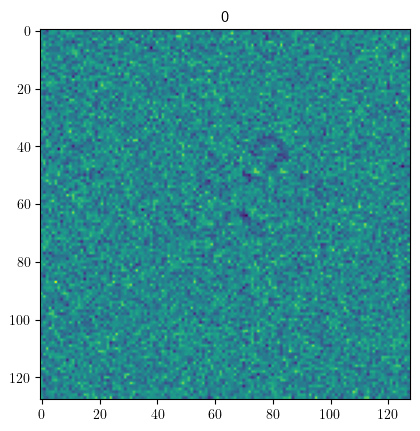

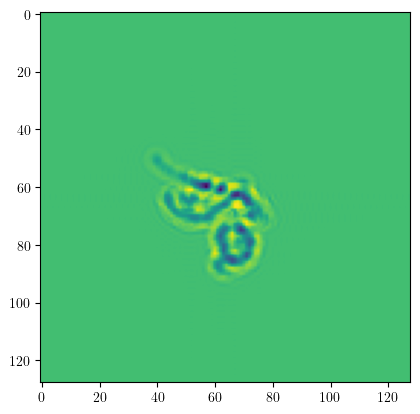

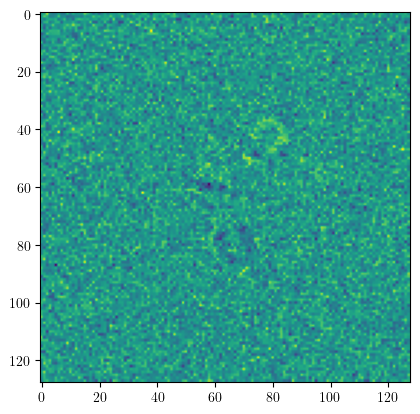

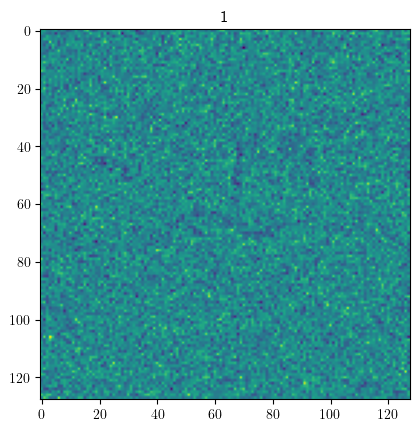

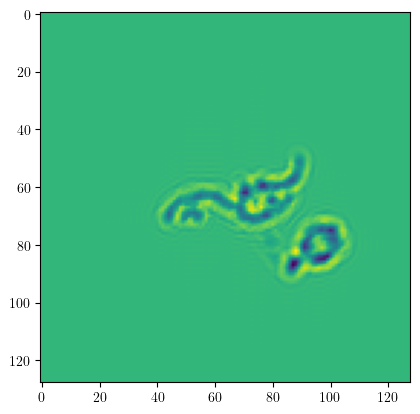

...

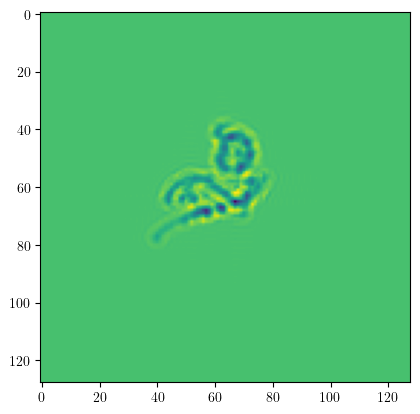

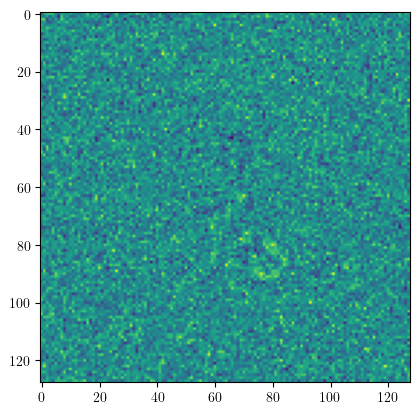

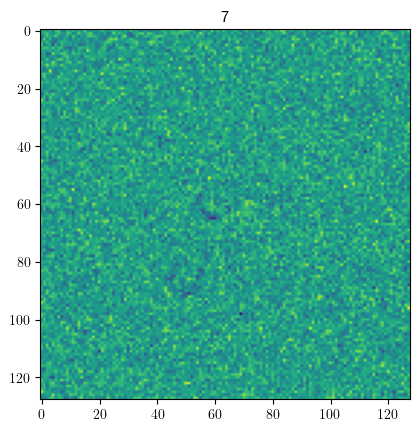

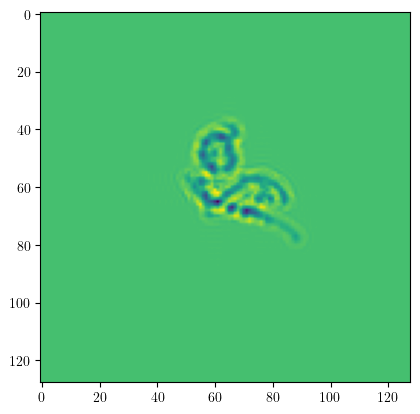

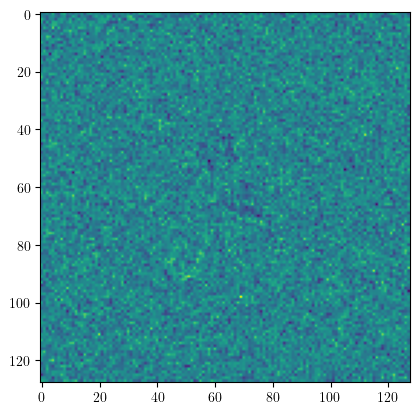

In [55]:
for k in range(8):
    plt.figure()
    plt.title(str(k))
    plt.imshow(image_stack2[k])
    plt.figure()
    plt.imshow(image_stack[k])
    plt.figure()
    plt.imshow(image_stack[k] - image_stack2[k])


(INFO) (ctf.py) (05-Dec-23 09:09:15) Image size (pix)  : 19810
(INFO) (ctf.py) (05-Dec-23 09:09:15) A/pix             : 17782.5
(INFO) (ctf.py) (05-Dec-23 09:09:15) DefocusU (A)      : 36.04999923706055
(INFO) (ctf.py) (05-Dec-23 09:09:15) DefocusV (A)      : 300.0
(INFO) (ctf.py) (05-Dec-23 09:09:15) Dfang (deg)       : 2.700000047683716
(INFO) (ctf.py) (05-Dec-23 09:09:15) voltage (kV)      : 0.07000000029802322
(INFO) (ctf.py) (05-Dec-23 09:09:15) cs (mm)           : 0.0
(INFO) (ctf.py) (05-Dec-23 09:09:15) w                 : 0.0
(INFO) (ctf.py) (05-Dec-23 09:09:15) Phase shift (deg) : 1.0


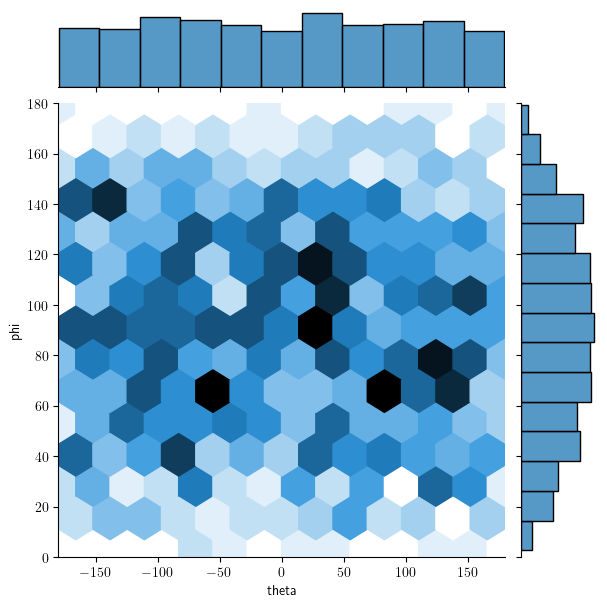

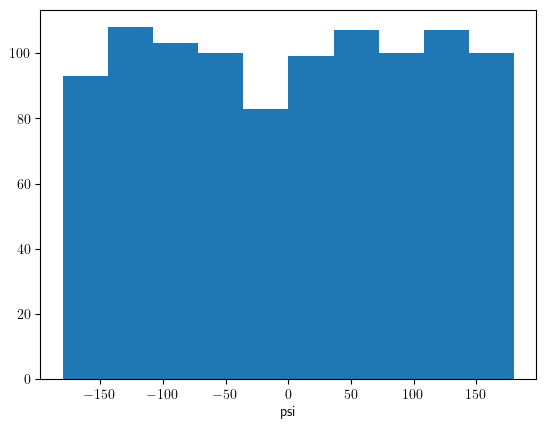

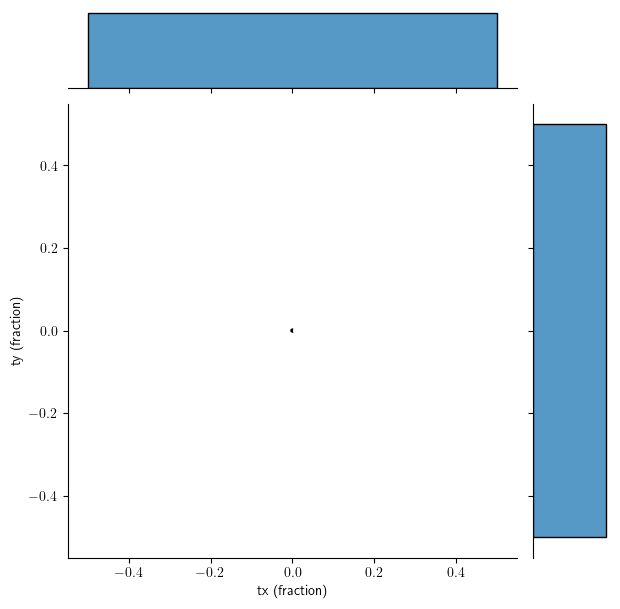

In [69]:
# Convert rotation matrices to euler angles
rots = np.concatenate([cryo.rotation_matrices for cryo in cryos])
euler = RR.from_matrix(rots).as_euler('zyz', degrees=True)
trans = np.concatenate([cryo.translations for cryo in cryos])
ctf_params = np.concatenate([cryo.CTF_params for cryo in cryos])
ctf.print_ctf_params(ctf_params[0])
# rotations
analysis.plot_euler(euler[:,0],euler[:,1], euler[:,2])
sns.jointplot(x=trans[:,0],
              y=trans[:,1],
              kind='hex').set_axis_labels('tx (fraction)','ty (fraction)')

In [70]:
from recovar import regularization, synthetic_dataset, noise, homogeneous, utils
# cryos = dataset.get_split_datasets_from_dict(dataset_loader_dict, ind_split)
reload(homogeneous)
cryo = cryos[0]
gpu_memory = utils.get_gpu_memory_total()
volume_shape = cryo.volume_shape
disc_type = "nearest"

batch_size = utils.get_image_batch_size(cryo.grid_size, gpu_memory)

cov_noise= sim_info['noise_variance'][0]
# I need to rewrite the reweighted so it can use the more general noise distribution, but for now I'll go with that. 
cov_noise_init = cov_noise
valid_idx = cryo.get_valid_frequency_indices()

# Compute mean
means, mean_prior, _, _ = homogeneous.get_mean_conformation(cryos, 1*batch_size, None , valid_idx, 'nearest', use_noise_level_prior = False, grad_n_iter = 0)
means2, mean_prior2, _, _ = homogeneous.get_mean_conformation(cryos, 1*batch_size, None , valid_idx, 'nearest', use_noise_level_prior = True, grad_n_iter = 0)


(INFO) (homogeneous.py) (05-Dec-23 09:09:34) regularization init done
(WARNING) (homogeneous.py) (05-Dec-23 09:09:34) TOOK OUT IMAGE MASK IN MEAN!!! PUT IT BACK??
(WARNING) (homogeneous.py) (05-Dec-23 09:09:35) TOOK OUT IMAGE MASK IN MEAN!!! PUT IT BACK??
(WARNING) (homogeneous.py) (05-Dec-23 09:09:35) TOOK OUT IMAGE MASK IN MEAN!!! PUT IT BACK??
(WARNING) (homogeneous.py) (05-Dec-23 09:09:35) TOOK OUT IMAGE MASK IN MEAN!!! PUT IT BACK??
(WARNING) (homogeneous.py) (05-Dec-23 09:09:35) TOOK OUT IMAGE MASK IN MEAN!!! PUT IT BACK??
(WARNING) (homogeneous.py) (05-Dec-23 09:09:35) TOOK OUT IMAGE MASK IN MEAN!!! PUT IT BACK??
(INFO) (homogeneous.py) (05-Dec-23 09:09:36) Using new prior
(INFO) (homogeneous.py) (05-Dec-23 09:09:36) time to compute means: 1.3027913570404053
(INFO) (homogeneous.py) (05-Dec-23 09:09:36) regularization init done
(WARNING) (homogeneous.py) (05-Dec-23 09:09:36) TOOK OUT IMAGE MASK IN MEAN!!! PUT IT BACK??
(WARNING) (homogeneous.py) (05-Dec-23 09:09:36) TOOK OUT IMAG

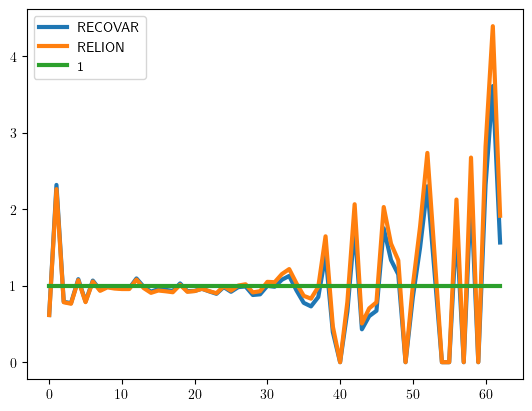

In [71]:
from recovar import regularization, synthetic_dataset, noise, homogeneous, utils
# sim_info = recovar.utils.pickle_load(sim_info)
gt_recon = synthetic_dataset.load_heterogeneous_reconstruction(sim_info, volumes_path_root = None)

xx = regularization.average_over_shells(np.abs(mean_prior), volume_shape)
xx2 = regularization.average_over_shells(np.abs(mean_prior2), volume_shape)

gt_PS = regularization.average_over_shells(np.abs(gt_recon.get_mean())**2, volume_shape)

# comp_PS = regularization.average_over_shells(np.abs(means['combined'])**2, volume_shape)


plt.semilogy(xx /gt_PS ,label ='RECOVAR', lw = 3)
plt.semilogy(xx2/ gt_PS, label ='RELION', lw = 3)
plt.semilogy(np.ones_like(xx), label ='1', lw = 3)
plt.yscale('linear')
plt.legend()

# plt.figure()

# plt.semilogy(xx,label ='prior 1')
# plt.semilogy(xx2, label ='prior 2')
# plt.semilogy(comp_PS, label ='comp')
# plt.semilogy(gt_PS, label ='gt')
# plt.legend()


(INFO) (ctf.py) (05-Dec-23 09:00:14) Image size (pix)  : 20051
(INFO) (ctf.py) (05-Dec-23 09:00:14) A/pix             : 18385.0
(INFO) (ctf.py) (05-Dec-23 09:00:14) DefocusU (A)      : 62.02000045776367
(INFO) (ctf.py) (05-Dec-23 09:00:14) DefocusV (A)      : 300.0
(INFO) (ctf.py) (05-Dec-23 09:00:14) Dfang (deg)       : 2.700000047683716
(INFO) (ctf.py) (05-Dec-23 09:00:14) voltage (kV)      : 0.07000000029802322
(INFO) (ctf.py) (05-Dec-23 09:00:14) cs (mm)           : 0.0
(INFO) (ctf.py) (05-Dec-23 09:00:14) w                 : 0.0
(INFO) (ctf.py) (05-Dec-23 09:00:14) Phase shift (deg) : 1.0


/home/mg6942/.conda/envs/recovar2/lib/python3.9/site-packages/matplotlib/dviread.py:1048: ResourceWarning:

unclosed file <_io.BufferedWriter name=88>

/home/mg6942/.conda/envs/recovar2/lib/python3.9/site-packages/matplotlib/dviread.py:1048: ResourceWarning:

unclosed file <_io.BufferedReader name=89>



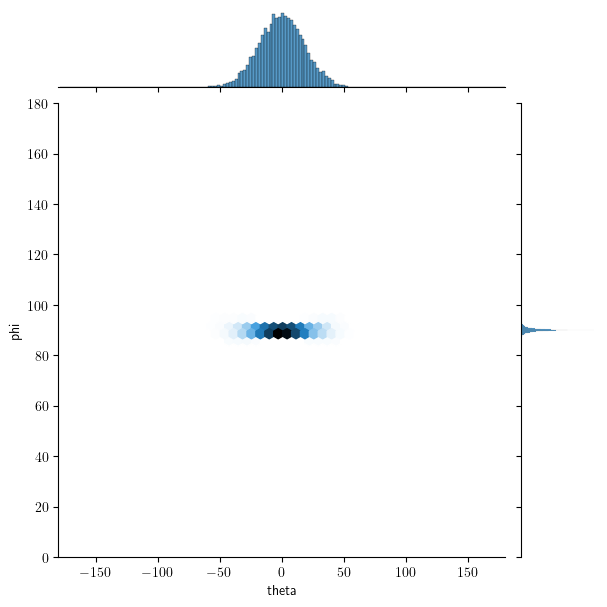

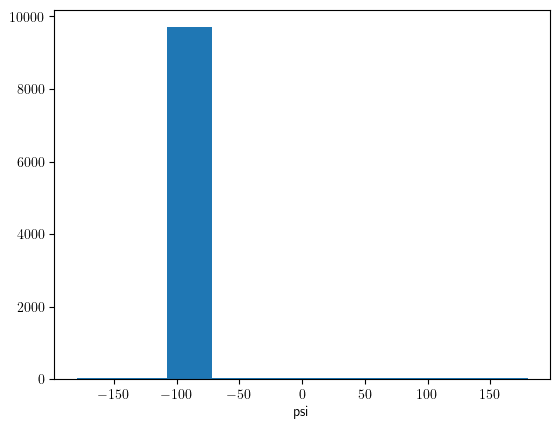

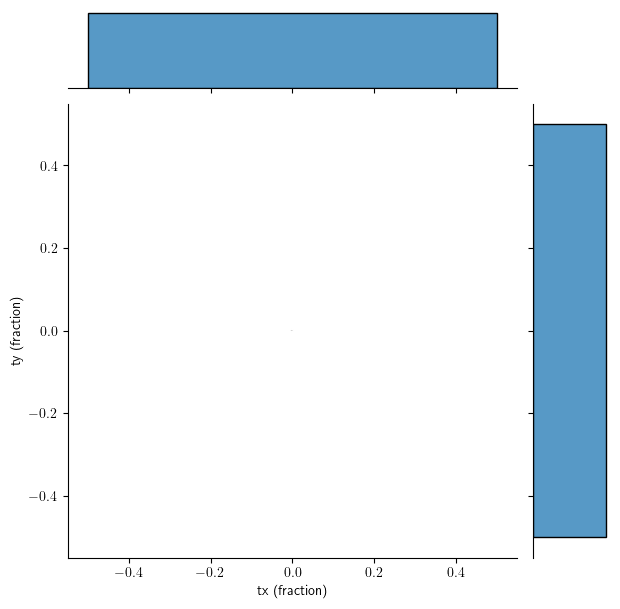

In [16]:
disc_type = 'nearest'
import jax.numpy as jnp
lhs = 0; rhs = 0 
means = {}
for cryo_idx, cryo in enumerate(cryos):
    lhs_t, rhs_t = homogeneous.compute_mean_volume(cryo, cov_noise,  mean_prior, batch_size, disc_type = disc_type, n_iter = 1, return_lhs_rhs = True, mean_estimate = mean_prior*0, image_weights = None )
        
    means["corrected" + str(cryo_idx)] = np.array( jnp.where(jnp.abs(lhs_t) < 1e-8, 0, rhs_t / (lhs_t + 1 / mean_prior ) ))
    lhs +=  lhs_t
    rhs +=  rhs_t

    
    
key = "corrected"
mean_prior, fsc, prior_avg = regularization.compute_relion_prior(cryos, cov_noise, means["corrected0"], means["corrected1"], batch_size, estimate_merged_SNR = False)

mean_prior2, fsc, prior_avg = regularization.compute_fsc_prior_gpu_v2(cryo.volume_shape, means["corrected0"], means["corrected1"], lhs/2 , mean_prior, frequency_shift = jnp.array([0,0,0]))


(WARNING) (homogeneous.py) (05-Dec-23 08:51:55) TOOK OUT IMAGE MASK IN MEAN!!! PUT IT BACK??
(WARNING) (homogeneous.py) (05-Dec-23 08:51:56) TOOK OUT IMAGE MASK IN MEAN!!! PUT IT BACK??


In [ ]:
from recovar import regularization, synthetic_dataset, noise, homogeneous, utils
sim_info = recovar.utils.pickle_load(recovar_result_dir + '../simulation_info.pkl')
gt_recon = synthetic_dataset.load_heterogeneous_reconstruction(sim_info, volumes_path_root = None)


xx = regularization.average_over_shells(np.abs(mean_prior), volume_shape)
xx2 = regularization.average_over_shells(np.abs(mean_prior2), volume_shape)

gt_PS = regularization.average_over_shells(np.abs(gt_recon.get_mean())**2, volume_shape)

comp_PS = regularization.average_over_shells(np.abs(means['combined'])**2, volume_shape)


plt.semilogy(xx,label ='prior 1')
plt.semilogy(xx2, label ='prior 2')
plt.semilogy(comp_PS, label ='comp')
plt.semilogy(gt_PS, label ='gt')
plt.legend()

In [ ]:
gt_recon.probs_of_state

In [ ]:
plt.plot(xx/gt_PS,label ='prior 1')
plt.plot(xx2/gt_PS, label ='prior 2')


In [ ]:
import numpy as np
import numpy as np
from scipy.interpolate import make_interp_spline
import matplotlib.pyplot as plt 
import scipy
import matplotlib
font = {'family' : 'normal',
    'weight' : 'bold',
    'size'   : 22}

matplotlib.rc('font', **font)

# Dataset

xx = gt_recon.volumes[:,500000].real
xx_norm = xx/np.max(np.abs(xx)) /1

y = xx_norm
x =np.arange(y.size)
 
X_Y_Spline = make_interp_spline(x, y)
 
# Returns evenly spaced numbers
# over a specified interval.
X_ = np.linspace(x.min(), x.max(), 500)
Y_ = X_Y_Spline(X_)

noise = np.random.randn(Y_.size)*np.sqrt(50)
# Plotting the Graph
y_p_noise = Y_ + noise
plt.plot(X_, y_p_noise, alpha = 1)
plt.plot(X_, Y_, lw = 5, color = 'k')

# denoise_y = scipy.ndimage.gaussian_filter(y_p_noise, sigma = 30)

# plt.plot(X_, denoise_y , lw =5, alpha = 0.5)



# plt.title("Plot Smooth Curve Using the scipy.interpolate.make_interp_spline() Class")
# plt.xlabel("conformation z")
# plt.ylabel("xi(z)")
plt.show()


In [ ]:
denoise_y.shape

In [ ]:
xx = gt_recon.volumes[:,500000].real
xx_norm = xx/np.max(np.abs(xx))
plt.plot(xx_norm)

In [ ]:
plt.plot(xx/gt_PS,label ='prior 1')
plt.plot(xx2/gt_PS,label ='prior 2')

In [ ]:
xx/gt_PS

### Load result from pipeline.py

In [ ]:
# Specify the result dir
# recovar_result_dir = '/projects/CRYOEM/singerlab/mg6942/challenge_1/cryoem_heterogeneity_challenge_2023_first_dataset/test_white_rescale_dil2_zerovar/'
# recovar_result_dir = '/scratch/gpfs/mg6942/cryodrgn_empiar/empiar10076/inputs/test-new-code-radial/'
recovar_result_dir = '/scratch/gpfs/mg6942/cryodrgn_empiar/empiar10076/inputs/test-newest-whitw-256/'
recovar_result_dir = '/projects/CRYOEM/singerlab/mg6942/synthetic_test/results/'
recovar_result_dir = '/home/mg6942/mytigress/synthetic_outlier/test/'
recovar_result_dir = '/projects/CRYOEM/singerlab/mg6942/synthetic_outlier/test-contrast-radial/'
recovar_result_dir = '/projects/CRYOEM/singerlab/mg6942/synthetic_outlier_nm1/test-contrast-radial/'
recovar_result_dir = '/projects/CRYOEM/singerlab/mg6942/synthetic_clean_white_nm1_homog_nearest_nonuniform/test/'
# recovar_result_dir = '/projects/CRYOEM/singerlab/mg6942/synthetic_clean_white_nm2_homog/test/'


# Load z
results = output.load_results_new(recovar_result_dir)
# del results['u']['real']
# del results['u']['rescaled_no_contrast']
cryos = dataset.load_dataset_from_args(results['input_args'], lazy = True)
zdim = 20#list(results['zs'].keys())[-1]
print("available zdim:", list(results['zs'].keys()), "using:", zdim)
z = results['zs'][zdim]

In [ ]:
utils.report_memory_device()

In [ ]:
# from pipeline import *

# doc = ['/home/mg6942/mytigress/synthetic_clean_white_nm2_nearest/particles.128.mrcs','--poses', '/home/mg6942/mytigress/synthetic_clean_white_nm2_nearest/poses.pkl']
# parser = argparse.ArgumentParser(description=doc)
# args = add_args(parser).parse_args()
# standard_recovar_pipeline(args)


# # parser = argparse.ArgumentParser(['/home/mg6942/mytigress/synthetic_clean_white_nm2_nearest/particles.128.mrcs','--poses', '/home/mg6942/mytigress/synthetic_clean_white_nm2_nearest/poses.pkl'] )
# # args = add_args(parser)
# # # args.particles = '/home/mg6942/mytigress/synthetic_clean_white_nm2_nearest/particles.128.mrcs'
# # # args.poses = '/home/mg6942/mytigress/synthetic_clean_white_nm2_nearest/poses.pkl'
# # # args.ctf = '/home/mg6942/mytigress/synthetic_clean_white_nm2_nearest/ctf.pkl'
# # # args.outdir = '/home/mg6942/mytigress/synthetic_clean_white_nm2_nearest/test'
# # args = args.parse_args()


In [ ]:
# def variance_metric(volumes, volume_distribution):
import recovar
# output_folder = "/home/mg6942/mytigress/synthetic_test/"
# # results
# sim_info = recovar.utils.pickle_load(output_folder + 'simulation_info.pkl')
sim_info = recovar.utils.pickle_load(recovar_result_dir + '../simulation_info.pkl')
gt_recon = synthetic_dataset.load_heterogeneous_reconstruction(sim_info, volumes_path_root = None)

plt.figure(figsize = (10,10))
plt.plot(sim_info['noise_variance'], '-o', label = 'gt')
plt.plot(results['noise_var_outside_mask'],  label = 'outside')
plt.plot(results['ub_noise_var'], label = 'ub')
# plt.plot(ub, label = 'ub2')

plt.plot(results['cov_noise_second'], label = 'cov_noise_second')
# plt.plot(results['noise_var'],  label = 'est')
plt.plot(results['cov_noise'] * np.ones_like(results['noise_var_outside_mask']), label = 'cov_noise')
plt.plot(results['cov_noise_white_second'] * np.ones_like(results['noise_var_outside_mask']), '-*', label = 'cov_noise_white_second')

plt.plot(results['image_PS'] , label = 'cov_noise')

plt.xlim([0,64])
plt.ylim([1.5e-6,2.5e-6])
# plt.yscale('log')
plt.legend()

In [ ]:
recovar_result_dir = '/projects/CRYOEM/singerlab/mg6942/synthetic_20_nm2_lin/'
sim_info = recovar.utils.pickle_load(recovar_result_dir + '/simulation_info.pkl')

In [ ]:
from recovar import utils
# covariance_cols = utils.pickle_load( "/home/mg6942/mytigress/synthetic_clean_white/cols_one_linear_interp.pkl")
# covariance_cols_2 = utils.pickle_load( "/home/mg6942/mytigress/synthetic_clean_white/cols_one_nearest.pkl")
covariance_cols_2 = utils.pickle_load( "/home/mg6942/mytigress/synthetic_clean_white/cols_one_nearest_fixed.pkl")
covariance_cols_3 = utils.pickle_load( "/home/mg6942/mytigress/synthetic_clean_white/cols_one_nearest_unfixed.pkl")


In [ ]:
from recovar import synthetic_dataset
reload(synthetic_dataset)
gt_recon = synthetic_dataset.load_heterogeneous_reconstruction(sim_info, volumes_path_root = None)
gt_var = gt_recon.get_fourier_variances()[results['picked_frequencies']]
# gt_var = (np.abs(gt_recon.mean)**2)[results['picked_frequencies']]

plt.plot(gt_var, label = 'gt', alpha = 0.5 )
# computed_variances = utils.get_variances(covariance_cols['est_mask'], results['picked_frequencies']  ).real/1.0#*1.7
# plt.plot((computed_variances), label = 'comp', alpha = 0.5)

computed_variance_2 = utils.get_variances(covariance_cols_2['est_mask'], results['picked_frequencies']  ).real
plt.plot(computed_variance_2, label = 'comp_2', alpha = 0.5)

computed_variance_3 = utils.get_variances(covariance_cols_3['est_mask'], results['picked_frequencies']  ).real
plt.plot(computed_variance_3, label = 'comp_3', alpha = 0.5)

plt.legend()

In [ ]:
import jax.numpy as jnp
max_dist = 2
jnp.mgrid[-max_dist:max_dist,-max_dist:max_dist,-max_dist:max_dist].shape

In [ ]:
np.linalg.norm(computed_variance_2 - gt_var)/np.linalg.norm(gt_var)

In [ ]:
np.linalg.norm(computed_variance_3 - gt_var)/np.linalg.norm(gt_var)

In [ ]:
gt_col = gt_recon.get_covariance_columns(results['picked_frequencies'])

In [ ]:
for x in [covariance_cols_2['est_mask'],covariance_cols_3['est_mask']]:
    print(np.linalg.norm(x[results['picked_frequencies']] - gt_col[results['picked_frequencies']]) / np.linalg.norm(gt_col[results['picked_frequencies']]))

# Diagnostics
* if the mask looks very wrong, it is likely that the uninvert-data is poorly set. 
Use --uninvert-data=true (or false, depending on what you set before). 
If you use automatic, then you can check what it chose and take the oposite by looking at:
print(results['input_args'].uninvert_data)

* If the first eigenvector is mostly positive and looks like the mean, your data might have significant contrast.
Use the --correct-contrast option

* If the one of the eigenvector looks like the mask, your data might have been mean substracted. You may want to use 
Use the --ignore-zero-frequency option

Note that these are options to rectify these problems in case your data has them. The far better option, if applicable, is to just to not normalize your image stack.

In [ ]:
from recovar import synthetic_dataset
reload(synthetic_dataset)
HH = synthetic_dataset.load_heterogeneous_reconstruction(sim_info, volumes_path_root = None)

In [ ]:
from recovar import utils
xxx = utils.find_angle_between_subspaces(results['u']['rescale'],results2['u']['rescale'], 100)

In [ ]:
reload(plot_utils)
n_eigs = 10
if 'real' in results['u']:
    plot_utils.plot_summary_t(results,cryos, n_eigs=n_eigs, u_key = "real")
plot_utils.plot_summary_t(results,cryos, n_eigs=n_eigs, u_key = "rescaled")
# plot_utils.plot_summary_t(results,cryos, n_eigs=n_eigs, u_key = "rescaled_10")
plot_utils.plot_noise_profile(results)

In [ ]:
from recovar import synthetic_dataset
reload(synthetic_dataset)
gt_recon = synthetic_dataset.load_heterogeneous_reconstruction(sim_info, volumes_path_root = None)
# u, s = gt_recon.get_co
# results['s'] 

In [ ]:
u, s = gt_recon.get_covariance_eigendecomposition()
results['s']['gt'] = s
results['u']['gt'] = u

In [ ]:
# Plot FSC of mean, decay of eigenvalues
plot_utils.plot_mean_fsc(results, cryos)
results['s']['var_s'] = np.mean(np.abs(z)**2, axis=0)
plot_utils.plot_cov_results(results['u'], results['s'])
if results['input_args'].correct_contrast:
    plt.hist(results['contrasts'][zdim], bins = 101)
    np.var(results['contrasts'][zdim])

### Load result from analyze

In [ ]:
# If you changed the output dir, specify it here
from cryodrgn import utils
analysis_dir = f'{recovar_result_dir}output/analysis_{zdim}'

# Load UMAP
umap = utils.load_pkl(f'{analysis_dir}/umap_embedding.pkl')
# or run UMAP
# umap = analysis.run_umap(z)

In [ ]:
# Load kmeans
K = 40
# kmeans_labels = utils.load_pkl(f'{WORKDIR}/analyze.{EPOCH}/kmeans{K}/labels.pkl')
kmeans_results = utils.load_pkl(f'{analysis_dir}/kmeans_{K}/centers.pkl')
kmeans_centers = kmeans_results['centers']
kmeans_labels = kmeans_results['labels']

# Or re-run kmeans with the desired number of classes
# kmeans_labels, kmeans_centers = analysis.cluster_kmeans(z, 20)

# # Get index for on-data cluster center
if zdim > 1:
    kmeans_centers_2, centers_ind = analysis.get_nearest_point(z, kmeans_centers)

### Load dataset

In [ ]:
# Convert rotation matrices to euler angles
rots = np.concatenate([cryo.rotation_matrices for cryo in cryos])
euler = RR.from_matrix(rots).as_euler('zyz', degrees=True)
trans = np.concatenate([cryo.translations for cryo in cryos])
ctf_params = np.concatenate([cryo.CTF_params for cryo in cryos])
ctf.print_ctf_params(ctf_params[0])

### Learning curve

### PCA

In [ ]:
pc = z
if zdim ==1:
    plt.hist(z, bins =300)
    print("std ", np.sqrt(1/np.median(results['cov_zs'][1])))
    xxx = np.percentile(z, [0.1, 0.5,1,3,5, 50])
    plt.scatter(xxx, 300 * np.ones_like(xxx) , color = 'r')
else:
    g = sns.jointplot(x=pc[:,0], y=pc[:,1], kind='hex')
    g.set_axis_labels('PC1', 'PC2')
    if zdim >2:
        g = sns.jointplot(x=pc[:,0], y=pc[:,2], alpha=.1, s=1)
        g.set_axis_labels('PC1', 'PC3')

In [ ]:
import numpy as np
from sklearn.covariance import EllipticEnvelope
pred = EllipticEnvelope(random_state=0).fit_predict(z)
# predict returns 1 for an inlier and -1 for an outlier
# cov.predict([[0, 0],
#              [3, 3]])
# cov.covariance_
# cov.location_

In [ ]:
import numpy as np
from sklearn.neighbors import LocalOutlierFactor
X = z
clf = LocalOutlierFactor()
pred2 = clf.fit_predict(X)
clf.negative_outlier_factor_

In [ ]:
plt.bar(np.arange(z.shape[1])+1,np.var(z, axis=0))
plt.xticks(np.arange(z.shape[1])+1)
plt.xlabel('PC')
plt.ylabel('explained variance')

### View UMAP

In [ ]:
g = sns.jointplot(x=umap[:,0], y=umap[:,1], alpha=.1, s=1)
g.set_axis_labels('UMAP1', 'UMAP2')

In [ ]:
g = sns.jointplot(x=umap[:,0], y=umap[:,1], kind='hex')
g.set_axis_labels('UMAP1', 'UMAP2')

### View pose and shift distribution 

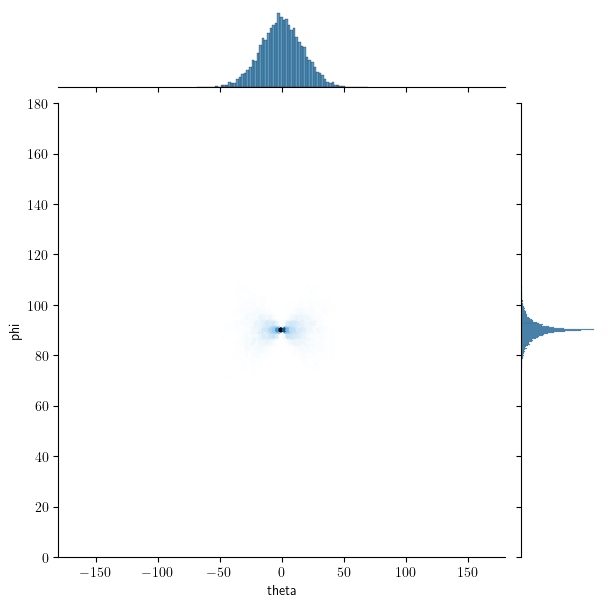

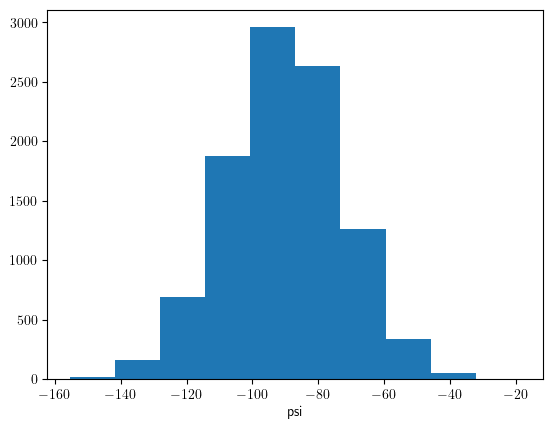

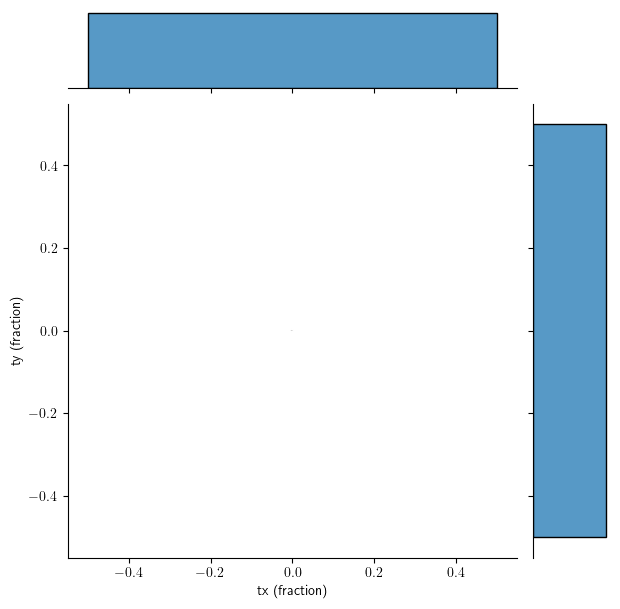

In [36]:
# Convert rotation matrices to euler angles
rots = np.concatenate([cryo.rotation_matrices for cryo in cryos])
euler = RR.from_matrix(rots).as_euler('zyz', degrees=True)
trans = np.concatenate([cryo.translations for cryo in cryos])
ctf_params = np.concatenate([cryo.CTF_params for cryo in cryos])
ctf.print_ctf_params(ctf_params[0])
# rotations
analysis.plot_euler(euler[:,0],euler[:,1], euler[:,2])
sns.jointplot(x=trans[:,0],
              y=trans[:,1],
              kind='hex').set_axis_labels('tx (fraction)','ty (fraction)')

### View K-means clusters

In [ ]:
K = len(set(kmeans_labels))
c = kmeans_centers
analysis.plot_by_cluster(pc[:,0], pc[:,1], K, 
                         kmeans_labels, 
                         centers=c,
                         annotate=True)
plt.xlabel('PC1')
plt.ylabel('PC2')

In [ ]:
fig, ax = analysis.plot_by_cluster_subplot(pc[:,0], pc[:,1], K, 
                            kmeans_labels)

In [ ]:
analysis.plot_by_cluster(umap[:,0], umap[:,1], K, 
                         kmeans_labels, 
                         centers_ind=centers_ind,
                         annotate=True)
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')

In [ ]:
fig, ax = analysis.plot_by_cluster_subplot(umap[:,0], umap[:,1], K, 
                            kmeans_labels)

### Load one of the trajectories and plot it over density

In [ ]:
zdim

In [ ]:
import json
path_r = json.load(open(f'{analysis_dir}/kmeans_{K}/path0/path.json', 'rb'))
path = np.array(path_r['path'])
subsampled = np.array(path_r['path_subsampled'])
output.plot_trajectories_over_density_from_result(results, [path], [subsampled], zdim=zdim )

In [ ]:
reload(output)
output.plot_two_twings_with_diff_scale([np.array(path_r['density']), np.array(path_r['weights'])], [None, None], labels = ['density', '|I(z)|'],plot_folder = None)

In [ ]:
# cryos[0].n_images

In [ ]:
output.plot_two_twings_with_diff_scale([np.array(path_r['density']), densities], [None, None], labels = ['density', '|I(z)|'],plot_folder = None)

In [ ]:
plt.hist(z, bins = 100)
# plt.scatter(path, np.array(path_r['density'])/20, color = 'r')

In [ ]:
results['zs'][4].shape

In [ ]:
## Or compute a new one between two end points
from compute_trajectory import compute_trajectory
# zdim, z_st, z_end, output_folder
z_st = kmeans_centers[1]
z_end = kmeans_centers[18]
compute_trajectory(results, zdim, z_st, z_end, output_folder = f'{analysis_dir}/kmeans_{K}/path_test' )


# Interactive visualization

Interactive visualization of the latent encodings for the trained model. Each point represents a particle image of the dataset. The hover text includes the index of the image in the particle stack. 

### Load into pandas dataframe

In [ ]:
# Load data into a pandas dataframe
df = analysis.load_dataframe(z=z, 
                             pc=pc, 
                             euler=euler, 
                             trans=trans, 
                             labels=kmeans_labels, 
                             umap=umap,
                             df1=ctf_params[:,2],
                             df2=ctf_params[:,3],
                             dfang=ctf_params[:,4],
                             phase=ctf_params[:,8])
df.head()

In [ ]:
# Annotated points correspond to kmeans cluster centers
widget, fig = analysis.ipy_plot_interactive_annotate(df,centers_ind)
VBox((widget,fig))

# Interactive selection

The next two cells contain helper code to select particles using an interactive lasso tool. 

1. In the first cell, select points with the lasso tool. The table widget is dynamically updated with the most recent selection's indices. 
2. Then once you've finalized your selection, use the next cell to save the particle indices for downstream analysis/viz.

(Double click to clear selection)

In [ ]:
widget, fig, ind_table = analysis.ipy_plot_interactive(df)
VBox((widget,fig,ind_table))

In [ ]:
ind_selected = ind_table.data[0].cells.values[0] # save table values
ind_selected = np.array(ind_selected)
ind_selected_not = np.array(sorted(set(np.arange(len(df))) - set(ind_selected)))

print('Selected indices:')
print(ind_selected)
print('Number of selected points:')
print(len(ind_selected))
print('Number of unselected points:')
print(len(ind_selected_not))

### Visualize selected subset

In [ ]:
# View PCA
plt.scatter(pc[:,0], pc[:,1], alpha=.1, s=1)
plt.scatter(pc[ind_selected,0], pc[ind_selected,1], alpha=.1, s=1)
plt.xlabel('PC1 ({:.2f})'.format(pca.explained_variance_ratio_[0]))
plt.ylabel('PC2 ({:.2f})'.format(pca.explained_variance_ratio_[1]))

In [ ]:
# View umap
plt.scatter(umap[:,0], umap[:,1], alpha=.1, s=1)
plt.scatter(umap[ind_selected,0], umap[ind_selected,1], alpha=.1, s=1)
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')

In [ ]:
# Subset of dataframe
df_sub = df.loc[ind_selected]
df_sub_not = df.loc[ind_selected_not]

In [ ]:
# View pose distribution
analysis.plot_euler(df_sub.theta, df_sub.phi, df_sub.psi)

In [ ]:
widget, fig, ind_table = analysis.ipy_plot_interactive(df_sub)
VBox((widget,fig,ind_table))

In [ ]:
# import plotly
# import numpy as np
# X = np.random.randn(10,3)
# from recovar import plot_utils
# plot_utils.plotly_scatter([X])
# # import plotly.express as px
# # fig = px.bar(x=["a", "b", "c"], y=[1, 3, 2])
# # fig.write_html('first_figure.html', auto_open=True)


### Save the index selection

The indices for the selected particles may be saved for use in downstream processing in cryoDRGN or with other tools. Within cryoDRGN, selections are saved as an index array in `.pkl` file format. Then, the selected indices can be provided to cryoDRGN with the `--ind` argument to train a new model on a subset of the images. 

Tools are provided in the `utils` subdirectory of the cryoDRGN repo to help convert the index selection to `.star` file format.

**NOTE:** If there are multiple rounds of index filtering performed on the same particle stack (i.e. your results come from a training run that already uses an --ind subselection), the index selection must be converted into the correct indices into the original dataset.

In [ ]:
#SAVE_PATH = f'{WORKDIR}/ind_selected.pkl' # RENAME ME

## IMPORTANT: convert index selection to original particles indices if current results have already been filtered

#if ind_orig is not None:
#    ind_selected_orig = analysis.convert_original_indices(ind_selected, N_orig, ind_orig)
#    utils.save_pkl(ind_selected_orig, SAVE_PATH)

#else:
#    utils.save_pkl(ind_selected, SAVE_PATH)

# View particles

View images at selected points in latent space

In [ ]:
particle_ind = ind_selected # or set to custom selection

In [ ]:
# choose 9 particles to view at random
if len(particle_ind) > 9:
    ind_subset9 = np.random.choice(particle_ind, 9, replace=False)
else: 
    ind_subset9 = particle_ind
print(ind_subset9)

In [ ]:
particle_ind

In [ ]:
p = [cryos[0].get_image_real(ii % cryos[0].n_images) for ii in ind_subset9]
analysis.plot_projections(p, ind_subset9)
widget, fig = analysis.ipy_plot_interactive_annotate(df, ind_subset9, opacity=.1)
VBox((widget,fig))

# Generate volumes

Generate volumes at selected points in latent space

In [ ]:
vol_ind = [] # ADD INDICES HERE
print(vol_ind)

In [ ]:
widget, fig = analysis.ipy_plot_interactive_annotate(df, vol_ind, opacity=.1)
VBox((widget,fig))

In [ ]:
def get_outdir():
    '''Helper function to get a clean directory to save volumes'''
    for i in range(100000):
        outdir = f'reconstruct_{i:06d}'
        if os.path.exists(outdir): continue
        else: break
    return outdir

def generate_volumes(zvalues, outdir, **kwargs):
    '''Helper function to call cryodrgn eval_vol and generate new volumes'''
    if not os.path.exists(outdir):
        os.mkdir(outdir)
    np.savetxt(f'{outdir}/zfile.txt', zvalues)
    analysis.gen_volumes(f'{WORKDIR}/weights.{EPOCH}.pkl',
                         f'{WORKDIR}/config.pkl',
                         f'{outdir}/zfile.txt',
                         f'{outdir}', **kwargs)
    return FileLinks(f'{outdir}/')

In [ ]:
# # Get a unique output directory, or define your own
# outdir = get_outdir()
# print(os.path.abspath(outdir))

In [ ]:
# Modify any defaults for volume generation -- see `cryodrgn eval_vol -h` for details 
Apix = 1 # Set to volume pixel size
flip = False # Hand flip?
invert = False # Invert contrast?
downsample = None # Set to smaller box size if desired
cuda = None # specify cuda device

generate_volumes(z[vol_ind], outdir, Apix=cryos[0].voxel_size, flip=flip, downsample=downsample, cuda=cuda, invert=invert)